In [1]:
import pandas as pd
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials

import requests
import json 
import pandas as pd
import numpy as np
from pandas.io.json import json_normalize

import plotly.express as pex
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering, KMeans, DBSCAN
from sklearn.neighbors import NearestNeighbors
from kneed import KneeLocator
from sklearn.cluster import FeatureAgglomeration

import plotly.graph_objects as go
from plotly.offline import init_notebook_mode, iplot

from statsmodels.stats.weightstats import ztest as ztest

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

import warnings
warnings.filterwarnings("ignore")

### Connection to API

In [181]:
CLIENT_ID = "e83d3836d10b4d06a00845db78de3dfb"
CLIENT_SECRET = "6aab53d5a2074b6d9552fb767cdf142c"

auth_manager = SpotifyClientCredentials(
    client_id=CLIENT_ID, client_secret=CLIENT_SECRET
)
spotify = spotipy.Spotify(client_credentials_manager=auth_manager)

### Exploration of first Playlist

In [3]:
playlist1=pd.DataFrame(spotify.playlist_items('https://open.spotify.com/playlist/1X0YrBQgTEv4ANBUgpLCJr'))
playlist1.head()

,href,items,limit,next,offset,previous,total
0,https://api.spotify.com/v1/playlists/1X0YrBQgT...,"{'added_at': '2019-11-02T10:31:58Z', 'added_by...",100,None,0,None,18
1,https://api.spotify.com/v1/playlists/1X0YrBQgT...,"{'added_at': '2019-11-02T10:32:09Z', 'added_by...",100,None,0,None,18
2,https://api.spotify.com/v1/playlists/1X0YrBQgT...,"{'added_at': '2019-11-02T10:32:36Z', 'added_by...",100,None,0,None,18
3,https://api.spotify.com/v1/playlists/1X0YrBQgT...,"{'added_at': '2019-11-02T10:32:56Z', 'added_by...",100,None,0,None,18
4,https://api.spotify.com/v1/playlists/1X0YrBQgT...,"{'added_at': '2019-11-02T10:33:17Z', 'added_by...",100,None,0,None,18


In [4]:
spotify.playlist('https://open.spotify.com/playlist/1X0YrBQgTEv4ANBUgpLCJr')['name']

'TOKYO MARATHON 2020'

Working out the details to bring the right info.

In [5]:
flatten_data=pd.json_normalize(playlist1['items'])
flatten_data.columns


Index(['added_at', 'is_local', 'primary_color',
       'added_by.external_urls.spotify', 'added_by.href', 'added_by.id',
       'added_by.type', 'added_by.uri', 'track.album.album_type',
       'track.album.artists', 'track.album.available_markets',
       'track.album.external_urls.spotify', 'track.album.href',
       'track.album.id', 'track.album.images', 'track.album.name',
       'track.album.release_date', 'track.album.release_date_precision',
       'track.album.total_tracks', 'track.album.type', 'track.album.uri',
       'track.artists', 'track.available_markets', 'track.disc_number',
       'track.duration_ms', 'track.episode', 'track.explicit',
       'track.external_ids.isrc', 'track.external_urls.spotify', 'track.href',
       'track.id', 'track.is_local', 'track.name', 'track.popularity',
       'track.preview_url', 'track.track', 'track.track_number', 'track.type',
       'track.uri', 'video_thumbnail.url'],
      dtype='object')

In [6]:
flatten_data['track.name']

0          Something Just Like This - Tokyo Remix
1                            Titanium (feat. Sia)
2                                        Dream On
3                   Every Teardrop Is a Waterfall
4                             A Sky Full of Stars
5                                Don't Wanna Know
6                                            Body
7                                    Back To Life
8                                         Secrets
9                             Best Day Of My Life
10                              Shut Up and Dance
11                                           Rise
12    Light It Up (feat. Nyla & Fuse ODG) [Remix]
13                    Young - Midnight Kids Remix
14                                      Great One
15                                        Circles
16                             How Far We've Come
17                                        Save Me
Name: track.name, dtype: object

In [7]:
forconcat=flatten_data['track.name']

In [8]:
playlist_1=[]
for i in flatten_data['track.external_urls.spotify']:
    playlist_1.append(spotify.audio_features(i))

In [9]:
songs=pd.DataFrame(playlist_1)
flatten_data2=pd.json_normalize(songs[0])


In [10]:
final_playlist_1=pd.concat((forconcat,flatten_data2),axis=1)

In [11]:
final_playlist_1

,track.name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,id,uri,track_href,analysis_url,duration_ms,time_signature
0,Something Just Like This - Tokyo Remix,0.374,0.860,11,-6.996,0,0.0563,0.00171,0.001140,0.9880,0.156,102.866,audio_features,255wsg35VRYqBK7uBtYOUz,spotify:track:255wsg35VRYqBK7uBtYOUz,https://api.spotify.com/v1/tracks/255wsg35VRYq...,https://api.spotify.com/v1/audio-analysis/255w...,273747,4
1,Titanium (feat. Sia),0.604,0.787,0,-3.674,0,0.1030,0.06790,0.150000,0.1270,0.301,126.062,audio_features,2dOTkLZFbpNXrhc24CnTFd,spotify:track:2dOTkLZFbpNXrhc24CnTFd,https://api.spotify.com/v1/tracks/2dOTkLZFbpNX...,https://api.spotify.com/v1/audio-analysis/2dOT...,245040,4
2,Dream On,0.307,0.433,1,-10.057,1,0.0290,0.38800,0.000091,0.3320,0.224,160.900,audio_features,5MxNLUsfh7uzROypsoO5qe,spotify:track:5MxNLUsfh7uzROypsoO5qe,https://api.spotify.com/v1/tracks/5MxNLUsfh7uz...,https://api.spotify.com/v1/audio-analysis/5MxN...,266960,4
3,Every Teardrop Is a Waterfall,0.425,0.732,9,-6.883,1,0.0396,0.00194,0.010300,0.1710,0.333,117.980,audio_features,2U8g9wVcUu9wsg6i7sFSv8,spotify:track:2U8g9wVcUu9wsg6i7sFSv8,https://api.spotify.com/v1/tracks/2U8g9wVcUu9w...,https://api.spotify.com/v1/audio-analysis/2U8g...,240796,4
4,A Sky Full of Stars,0.625,0.587,7,-9.812,1,0.0354,0.31800,0.678000,0.1140,0.255,125.025,audio_features,7k0KOplnvXm5GUkw7RXYg0,spotify:track:7k0KOplnvXm5GUkw7RXYg0,https://api.spotify.com/v1/tracks/7k0KOplnvXm5...,https://api.spotify.com/v1/audio-analysis/7k0K...,248000,4
5,Don't Wanna Know,0.783,0.623,7,-6.126,1,0.0800,0.33800,0.000000,0.0975,0.447,100.048,audio_features,5MFzQMkrl1FOOng9tq6R9r,spotify:track:5MFzQMkrl1FOOng9tq6R9r,https://api.spotify.com/v1/tracks/5MFzQMkrl1FO...,https://api.spotify.com/v1/audio-analysis/5MFz...,214480,4
6,Body,0.752,0.764,1,-4.399,1,0.0380,0.04760,0.000094,0.0543,0.582,121.958,audio_features,21RzyxY3EFaxVy6K4RqaU9,spotify:track:21RzyxY3EFaxVy6K4RqaU9,https://api.spotify.com/v1/tracks/21RzyxY3EFax...,https://api.spotify.com/v1/audio-analysis/21Rz...,163216,4
7,Back To Life,0.671,0.761,1,-5.208,0,0.0312,0.22400,0.000942,0.1290,0.263,125.971,audio_features,3U0PJqVS3a3Tiz65WzrEys,spotify:track:3U0PJqVS3a3Tiz65WzrEys,https://api.spotify.com/v1/tracks/3U0PJqVS3a3T...,https://api.spotify.com/v1/audio-analysis/3U0P...,194451,4
8,Secrets,0.743,0.748,0,-4.822,1,0.0519,0.76200,0.000063,0.0939,0.476,126.086,audio_features,3PGYOWmCia5R4iLRnGHwyf,spotify:track:3PGYOWmCia5R4iLRnGHwyf,https://api.spotify.com/v1/tracks/3PGYOWmCia5R...,https://api.spotify.com/v1/audio-analysis/3PGY...,215714,4
9,Best Day Of My Life,0.672,0.901,2,-2.415,1,0.0353,0.05450,0.000285,0.0792,0.507,99.989,audio_features,5k31cAfP8yymw8v0AYQIjr,spotify:track:5k31cAfP8yymw8v0AYQIjr,https://api.spotify.com/v1/tracks/5k31cAfP8yym...,https://api.spotify.com/v1/audio-analysis/5k31...,194000,4


### Create a function to retrieve the playlists

In [12]:
def playlisttodf(x):
    playlist=pd.DataFrame(spotify.playlist_items(x))
    flatten_1=pd.json_normalize(playlist['items'])
    songlist=[]
    for i in flatten_1['track.external_urls.spotify']:
        songlist.append(spotify.audio_features(i))
    df=pd.DataFrame(songlist)
    flatten_2=pd.json_normalize(df[0])
    final_playlist=pd.concat(((flatten_1['track.name']),flatten_2),axis=1)
    final_playlist['track_number_inlist']=final_playlist.index+1
    final_playlist['minutestamp']=(final_playlist['duration_ms'].cumsum())/60000
    y=spotify.playlist(x)['name']
    final_playlist['original_playlist']= y
    return final_playlist


### List of playlists

In [13]:
playlists={'https://open.spotify.com/playlist/37i9dQZF1DWUxdwkOJZYCJ',
           'https://open.spotify.com/playlist/37i9dQZF1DXadOVCgGhS7j',
           'https://open.spotify.com/playlist/37i9dQZF1DX4osfY3zybD2',
           'https://open.spotify.com/playlist/37i9dQZF1DWV3VLITCZusq',
           'https://open.spotify.com/playlist/37i9dQZF1DWT6anPZiHuxz',
           'https://open.spotify.com/playlist/7kaJyX5BmjtAY8J1FBkhJT',
           'https://open.spotify.com/playlist/6MIOcZ4tBKvEiQHzclhVAQ',
           'https://open.spotify.com/playlist/1X0YrBQgTEv4ANBUgpLCJr',
           'https://open.spotify.com/playlist/5lUOuqNxY8WJfMe9Nv5tDB',
           'https://open.spotify.com/playlist/4yIBTubggfMFHzkmSjjG72',
           'https://open.spotify.com/playlist/3tDmOy5nZSwhLnKCdl0b8s',
           'https://open.spotify.com/playlist/3OwazfLhODPTZgWHsjdiWY',
           'https://open.spotify.com/playlist/2sEk7UvY4KdIpPlTYez1Gk',
           'https://open.spotify.com/playlist/37i9dQZF1DZ06evO2ZhYVW',
           'https://open.spotify.com/playlist/37i9dQZF1DX0rlsbEODrkv',
           'https://open.spotify.com/playlist/37i9dQZF1DWZq91oLsHZvy',
           'https://open.spotify.com/playlist/37i9dQZF1DWZUTt0fNaCPB',
           'https://open.spotify.com/playlist/37i9dQZF1DX8jnAPF7Iiqp'
          }

### Create the first DataFrame

In [14]:
data=pd.DataFrame()
for i in playlists:
    y=playlisttodf(i)
    data=pd.concat((data,y))

In [15]:
data

,track.name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,...,type,id,uri,track_href,analysis_url,duration_ms,time_signature,track_number_inlist,minutestamp,original_playlist
0,Seal The Deal,0.530,0.973,4.0,-3.603,0.0,0.0663,0.000064,0.00558,0.1290,...,audio_features,7HyEcQge7Nj46xNFpKrsi5,spotify:track:7HyEcQge7Nj46xNFpKrsi5,https://api.spotify.com/v1/tracks/7HyEcQge7Nj4...,https://api.spotify.com/v1/audio-analysis/7HyE...,249306.0,4.0,1,4.155100,Running to Rock 170-190 BPM
1,Golden Woman,0.286,0.955,0.0,-2.999,1.0,0.0764,0.000008,0.40700,0.2350,...,audio_features,1T3H1dYVlvYrt8Jmbp1Ui0,spotify:track:1T3H1dYVlvYrt8Jmbp1Ui0,https://api.spotify.com/v1/tracks/1T3H1dYVlvYr...,https://api.spotify.com/v1/audio-analysis/1T3H...,188553.0,4.0,2,7.297650,Running to Rock 170-190 BPM
2,Shotgun Blues,0.528,0.947,2.0,-7.175,1.0,0.0518,0.000009,0.06320,0.1650,...,audio_features,2SMNxADB0ffqaIoOwl2x06,spotify:track:2SMNxADB0ffqaIoOwl2x06,https://api.spotify.com/v1/tracks/2SMNxADB0ffq...,https://api.spotify.com/v1/audio-analysis/2SMN...,267827.0,4.0,3,11.761433,Running to Rock 170-190 BPM
3,Bleed It Out,0.529,0.967,1.0,-3.647,0.0,0.0508,0.114000,0.00000,0.6100,...,audio_features,0UFDKFqW2oGspYeYqo9wjA,spotify:track:0UFDKFqW2oGspYeYqo9wjA,https://api.spotify.com/v1/tracks/0UFDKFqW2oGs...,https://api.spotify.com/v1/audio-analysis/0UFD...,166373.0,4.0,4,14.534317,Running to Rock 170-190 BPM
4,Hail to the King,0.580,0.916,3.0,-4.358,0.0,0.0387,0.000297,0.02590,0.1260,...,audio_features,5anCkDvJ17aznvK5TED5uo,spotify:track:5anCkDvJ17aznvK5TED5uo,https://api.spotify.com/v1/tracks/5anCkDvJ17az...,https://api.spotify.com/v1/audio-analysis/5anC...,305907.0,4.0,5,19.632767,Running to Rock 170-190 BPM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45,Harleys In Hawaii - KANDY Remix,0.661,0.796,10.0,-5.513,0.0,0.1540,0.143000,0.00000,0.2760,...,audio_features,5EECgBC0NjIaUd8ke9YYTo,spotify:track:5EECgBC0NjIaUd8ke9YYTo,https://api.spotify.com/v1/tracks/5EECgBC0NjIa...,https://api.spotify.com/v1/audio-analysis/5EEC...,165010.0,4.0,46,152.947767,Running x Remix
46,I Would Like - Gorgon City Remix,0.719,0.557,2.0,-6.187,0.0,0.0355,0.008060,0.00877,0.0965,...,audio_features,6shSHDBeA8Hj5qnyIq7jdQ,spotify:track:6shSHDBeA8Hj5qnyIq7jdQ,https://api.spotify.com/v1/tracks/6shSHDBeA8Hj...,https://api.spotify.com/v1/audio-analysis/6shS...,263655.0,4.0,47,157.342017,Running x Remix
47,Complicated (feat. Kiiara) - Robin Schulz Remix,0.820,0.723,0.0,-5.015,0.0,0.0680,0.039900,0.18500,0.1090,...,audio_features,30jTflhN1ExdH9RCBTVlcl,spotify:track:30jTflhN1ExdH9RCBTVlcl,https://api.spotify.com/v1/tracks/30jTflhN1Exd...,https://api.spotify.com/v1/audio-analysis/30jT...,289528.0,4.0,48,162.167483,Running x Remix
48,Burn Break Crash - Madison Mars Remix,0.611,0.855,0.0,-1.824,0.0,0.0754,0.188000,0.00000,0.1170,...,audio_features,0gyQR8SQvI9BqquYz1IkHI,spotify:track:0gyQR8SQvI9BqquYz1IkHI,https://api.spotify.com/v1/tracks/0gyQR8SQvI9B...,https://api.spotify.com/v1/audio-analysis/0gyQ...,223000.0,4.0,49,165.884150,Running x Remix


In [16]:
data.columns 

Index(['track.name', 'danceability', 'energy', 'key', 'loudness', 'mode',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'type', 'id', 'uri', 'track_href', 'analysis_url',
       'duration_ms', 'time_signature', 'track_number_inlist', 'minutestamp',
       'original_playlist'],
      dtype='object')

### My PCP_Marathon

In [17]:
PCP_M_link='https://open.spotify.com/playlist/2CPap0lQiK320ROUnBzxKk'

In [18]:
PCP_M=playlisttodf(PCP_M_link)

In [19]:
PCP_M

,track.name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,...,type,id,uri,track_href,analysis_url,duration_ms,time_signature,track_number_inlist,minutestamp,original_playlist
0,A Model of the Universe,0.336,0.044,7,-29.255,0,0.0456,0.98200,0.9600,0.2210,...,audio_features,5ay0cvjtVAbMLOe8gTadFh,spotify:track:5ay0cvjtVAbMLOe8gTadFh,https://api.spotify.com/v1/tracks/5ay0cvjtVAbM...,https://api.spotify.com/v1/audio-analysis/5ay0...,172444,4,1,2.874067,PCP_Marathon
1,Experience,0.447,0.449,2,-10.634,1,0.0376,0.93400,0.9610,0.0697,...,audio_features,1BncfTJAWxrsxyT9culBrj,spotify:track:1BncfTJAWxrsxyT9culBrj,https://api.spotify.com/v1/tracks/1BncfTJAWxrs...,https://api.spotify.com/v1/audio-analysis/1Bnc...,315427,4,2,8.131183,PCP_Marathon
2,"Tchaikovsky: Swan Lake, Op. 20, Act II: No. 10...",0.136,0.164,4,-18.756,0,0.0364,0.91100,0.9160,0.1090,...,audio_features,2xizRhme7pYeITbH1NLLGt,spotify:track:2xizRhme7pYeITbH1NLLGt,https://api.spotify.com/v1/tracks/2xizRhme7pYe...,https://api.spotify.com/v1/audio-analysis/2xiz...,166867,4,3,10.912300,PCP_Marathon
3,La Vida Es Bella - La Vida Es Bella,0.305,0.460,2,-9.463,1,0.0295,0.00468,0.3800,0.0777,...,audio_features,5sgRJe0Z1ol9wvSSsXcGaf,spotify:track:5sgRJe0Z1ol9wvSSsXcGaf,https://api.spotify.com/v1/tracks/5sgRJe0Z1ol9...,https://api.spotify.com/v1/audio-analysis/5sgR...,169333,4,4,13.734517,PCP_Marathon
4,I'm on Fire,0.307,0.136,3,-12.474,1,0.0341,0.92800,0.0122,0.1090,...,audio_features,7uMVMpAmxxq44QskyMoUU9,spotify:track:7uMVMpAmxxq44QskyMoUU9,https://api.spotify.com/v1/tracks/7uMVMpAmxxq4...,https://api.spotify.com/v1/audio-analysis/7uMV...,164323,3,5,16.473233,PCP_Marathon
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78,To Victory,0.443,0.827,1,-11.781,1,0.0469,0.00364,0.8360,0.2610,...,audio_features,0PQfyDuJBxQhx3NTUsAYiC,spotify:track:0PQfyDuJBxQhx3NTUsAYiC,https://api.spotify.com/v1/tracks/0PQfyDuJBxQh...,https://api.spotify.com/v1/audio-analysis/0PQf...,153720,1,79,294.419483,PCP_Marathon
79,The Avengers,0.250,0.553,7,-8.188,1,0.0429,0.60600,0.6730,0.1450,...,audio_features,5SXsXjVJCWeJuf7FHvgBYR,spotify:track:5SXsXjVJCWeJuf7FHvgBYR,https://api.spotify.com/v1/tracks/5SXsXjVJCWeJ...,https://api.spotify.com/v1/audio-analysis/5SXs...,123360,4,80,296.475483,PCP_Marathon
80,Divine Hammer,0.307,0.701,11,-10.546,0,0.0658,0.03070,0.8170,0.0953,...,audio_features,16t3wvIODRjSJQchL432vG,spotify:track:16t3wvIODRjSJQchL432vG,https://api.spotify.com/v1/tracks/16t3wvIODRjS...,https://api.spotify.com/v1/audio-analysis/16t3...,152218,4,81,299.012450,PCP_Marathon
81,The Ritual,0.399,0.692,7,-10.190,0,0.0735,0.05090,0.9510,0.1130,...,audio_features,3g68Xeeg1mei9te90np4iw,spotify:track:3g68Xeeg1mei9te90np4iw,https://api.spotify.com/v1/tracks/3g68Xeeg1mei...,https://api.spotify.com/v1/audio-analysis/3g68...,168869,4,82,301.826933,PCP_Marathon


### My PCP_5K

In [20]:
PCP_5_link='https://open.spotify.com/playlist/1DMr3PhwFzdLtC5AGjTi8E'

In [21]:
PCP_5=playlisttodf(PCP_5_link)

In [22]:
PCP_5

,track.name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,...,type,id,uri,track_href,analysis_url,duration_ms,time_signature,track_number_inlist,minutestamp,original_playlist
0,Sign of the Times - Stripped,0.534,0.251,0,-11.580,1,0.0351,0.8810,0.596000,0.1430,...,audio_features,0uaJBwwtP6FMqdDpHYNOk0,spotify:track:0uaJBwwtP6FMqdDpHYNOk0,https://api.spotify.com/v1/tracks/0uaJBwwtP6FM...,https://api.spotify.com/v1/audio-analysis/0uaJ...,159454,4,1,2.657567,PCP_5K
1,De Momento Abril,0.710,0.658,1,-8.310,1,0.0285,0.0358,0.009130,0.1470,...,audio_features,1kjJLQhV2NDCWCf0ParWAJ,spotify:track:1kjJLQhV2NDCWCf0ParWAJ,https://api.spotify.com/v1/tracks/1kjJLQhV2NDC...,https://api.spotify.com/v1/audio-analysis/1kjJ...,184480,3,2,5.732233,PCP_5K
2,Rise (Sam Feldt Remix),0.695,0.740,10,-6.970,1,0.0371,0.0155,0.000000,0.1430,...,audio_features,2PI3dfxZWkaEpBoCJq56RK,spotify:track:2PI3dfxZWkaEpBoCJq56RK,https://api.spotify.com/v1/tracks/2PI3dfxZWkaE...,https://api.spotify.com/v1/audio-analysis/2PI3...,162541,4,3,8.441250,PCP_5K
3,Ca plane pour moi,0.422,0.943,10,-4.365,1,0.0954,0.0740,0.000068,0.1050,...,audio_features,71yCMlsD6qbD7NmNUEoVNR,spotify:track:71yCMlsD6qbD7NmNUEoVNR,https://api.spotify.com/v1/tracks/71yCMlsD6qbD...,https://api.spotify.com/v1/audio-analysis/71yC...,182133,4,4,11.476800,PCP_5K
4,Dancing On My Own,0.674,0.857,6,-5.328,1,0.0346,0.0557,0.196000,0.0942,...,audio_features,6aqNCrRA7vs7v6QvRpI50t,spotify:track:6aqNCrRA7vs7v6QvRpI50t,https://api.spotify.com/v1/tracks/6aqNCrRA7vs7...,https://api.spotify.com/v1/audio-analysis/6aqN...,285854,4,5,16.241033,PCP_5K
5,Storm,0.507,0.415,7,-12.832,1,0.0366,0.3500,0.859000,0.0806,...,audio_features,6JNrZTngsgMzHVxKXAUt4A,spotify:track:6JNrZTngsgMzHVxKXAUt4A,https://api.spotify.com/v1/tracks/6JNrZTngsgMz...,https://api.spotify.com/v1/audio-analysis/6JNr...,155563,3,6,18.833750,PCP_5K
6,Is She With You? - Wonder Woman Theme,0.215,0.559,2,-15.129,0,0.0586,0.0270,0.825000,0.0861,...,audio_features,4BFBElI73LzkLOBru4TKVv,spotify:track:4BFBElI73LzkLOBru4TKVv,https://api.spotify.com/v1/tracks/4BFBElI73Lzk...,https://api.spotify.com/v1/audio-analysis/4BFB...,346744,1,7,24.612817,PCP_5K
7,Voldemort's End,0.113,0.219,1,-18.626,1,0.0529,0.6410,0.904000,0.1050,...,audio_features,1IO6EZbjAf4T5q4nv4oMSQ,spotify:track:1IO6EZbjAf4T5q4nv4oMSQ,https://api.spotify.com/v1/tracks/1IO6EZbjAf4T...,https://api.spotify.com/v1/audio-analysis/1IO6...,164213,3,8,27.349700,PCP_5K


In [23]:
PCP_5.columns

Index(['track.name', 'danceability', 'energy', 'key', 'loudness', 'mode',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'type', 'id', 'uri', 'track_href', 'analysis_url',
       'duration_ms', 'time_signature', 'track_number_inlist', 'minutestamp',
       'original_playlist'],
      dtype='object')

# CREATE A VISUALIZER FOR OTHER PLAYLISTS

In [24]:
marathons_list=[
           'https://open.spotify.com/playlist/1X0YrBQgTEv4ANBUgpLCJr',
           'https://open.spotify.com/playlist/5lUOuqNxY8WJfMe9Nv5tDB',
           'https://open.spotify.com/playlist/4yIBTubggfMFHzkmSjjG72',
           'https://open.spotify.com/playlist/3tDmOy5nZSwhLnKCdl0b8s',
           'https://open.spotify.com/playlist/3OwazfLhODPTZgWHsjdiWY',
           'https://open.spotify.com/playlist/2sEk7UvY4KdIpPlTYez1Gk',
           'https://open.spotify.com/playlist/37i9dQZF1DZ06evO2ZhYVW',   
]

In [25]:
def playlisttodf(x):
    playlist=pd.DataFrame(spotify.playlist_items(x))
    flatten_1=pd.json_normalize(playlist['items'])
    songlist=[]
    for i in flatten_1['track.external_urls.spotify']:
        songlist.append(spotify.audio_features(i))
    df=pd.DataFrame(songlist)
    flatten_2=pd.json_normalize(df[0])
    final_playlist=pd.concat(((flatten_1['track.name']),flatten_2),axis=1)
    final_playlist['track_number_inlist']=final_playlist.index+1
    final_playlist['minutestamp']=(final_playlist['duration_ms'].cumsum())/60000
    y=spotify.playlist(x)['name']
    final_playlist['original_playlist']= y
    return final_playlist

In [185]:
def visualizer(x):
    sfeat=['danceability', 'energy', 'loudness',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'minutestamp']
    scaler = StandardScaler()
    scaler.fit(x[sfeat])
    vis = pd.DataFrame(
    scaler.transform(x[sfeat]), columns=scaler.feature_names_in_)
    return sns.pairplot(vis,y_vars=['danceability', 'energy', 'loudness',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo'],x_vars=['minutestamp'], palette='greens')


In [180]:
for i in marathons_list:
    x=playlisttodf(i)
    visualizer(x)

ConnectionError: ('Connection aborted.', ConnectionResetError(54, 'Connection reset by peer'))

In [183]:
test=[]
for i in marathons_list:
    x=playlisttodf(i)
    test.append(x)

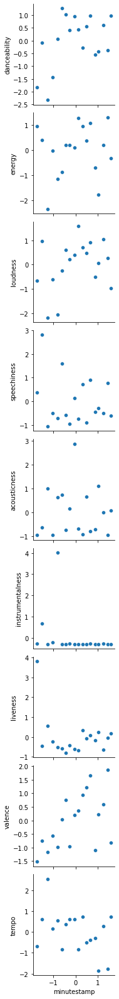

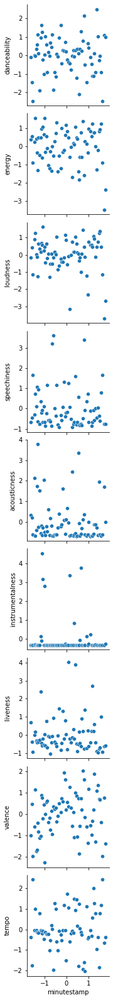

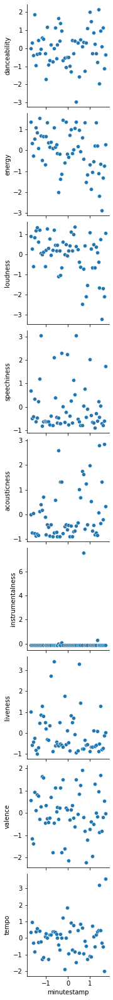

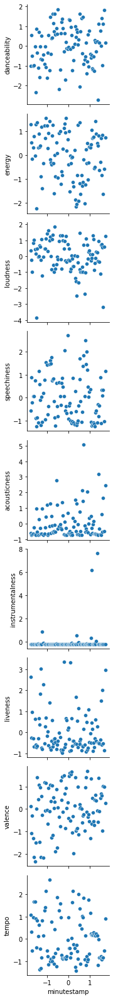

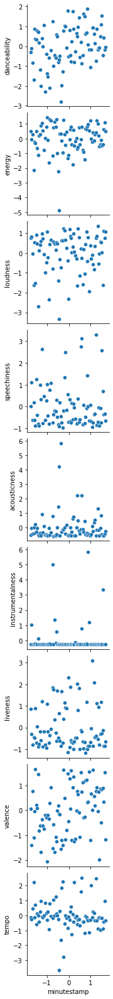

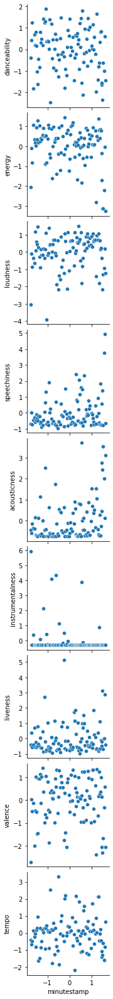

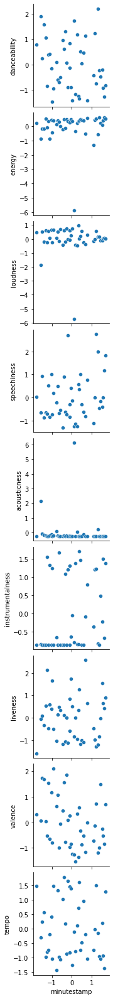

In [186]:
for i in range(7):
    visualizer(test[i]).savefig(f"Playlist{i}.png")

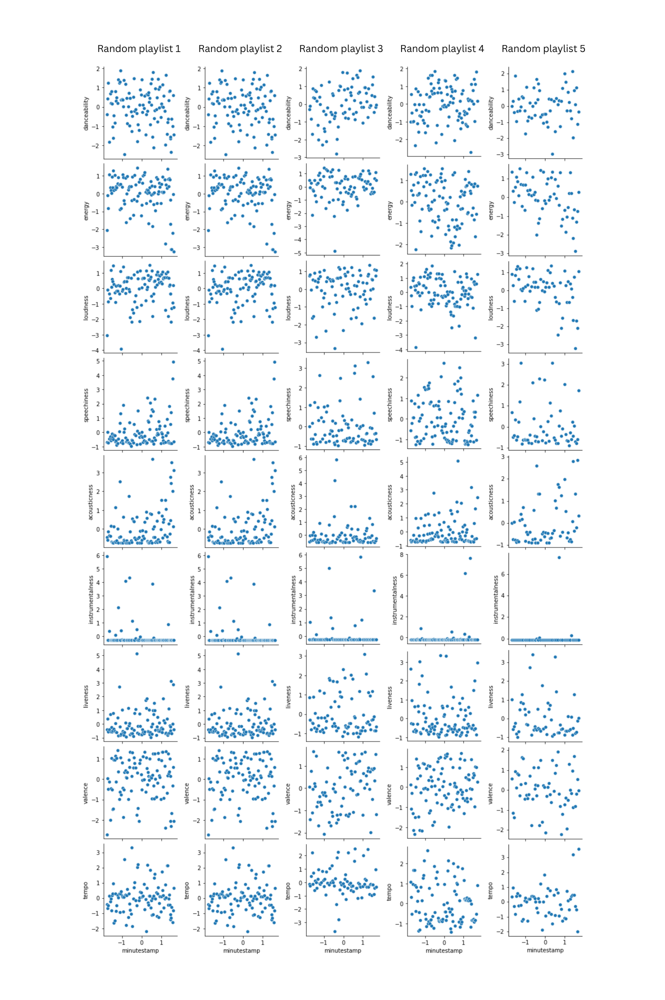

# Visualizing & Exploration Marathon

In [30]:
sfeat=['danceability', 'energy', 'key', 'loudness', 'mode',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'minutestamp']
scaler = StandardScaler()
scaler.fit(PCP_M[sfeat])


StandardScaler()

In [31]:
vis_M = pd.DataFrame(
    scaler.transform(PCP_M[sfeat]), columns=scaler.feature_names_in_
)
vis_M.head()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,minutestamp
0,-1.190800,-2.765517,0.361819,-5.014125,-1.230915,-0.313046,2.328962,1.863280,0.189023,-1.486780,-1.148988,-1.721934
1,-0.570137,-1.049956,-0.966986,-0.596234,0.812404,-0.423541,2.177658,1.865910,-0.767627,-1.595469,-1.058605,-1.663321
2,-2.309112,-2.257203,-0.435464,-2.523204,-1.230915,-0.440115,2.105158,1.747562,-0.519138,-1.471152,-2.446440,-1.632314
3,-1.364138,-1.003360,-0.966986,-0.318411,0.812404,-0.535417,-0.751721,0.337906,-0.717044,-0.267053,0.401577,-1.600848
4,-1.352955,-2.375810,-0.701225,-1.032780,0.812404,-0.471883,2.158745,-0.629392,-0.519138,-1.133720,-0.346022,-1.570313


In [32]:
vis_M.columns

Index(['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'minutestamp'],
      dtype='object')

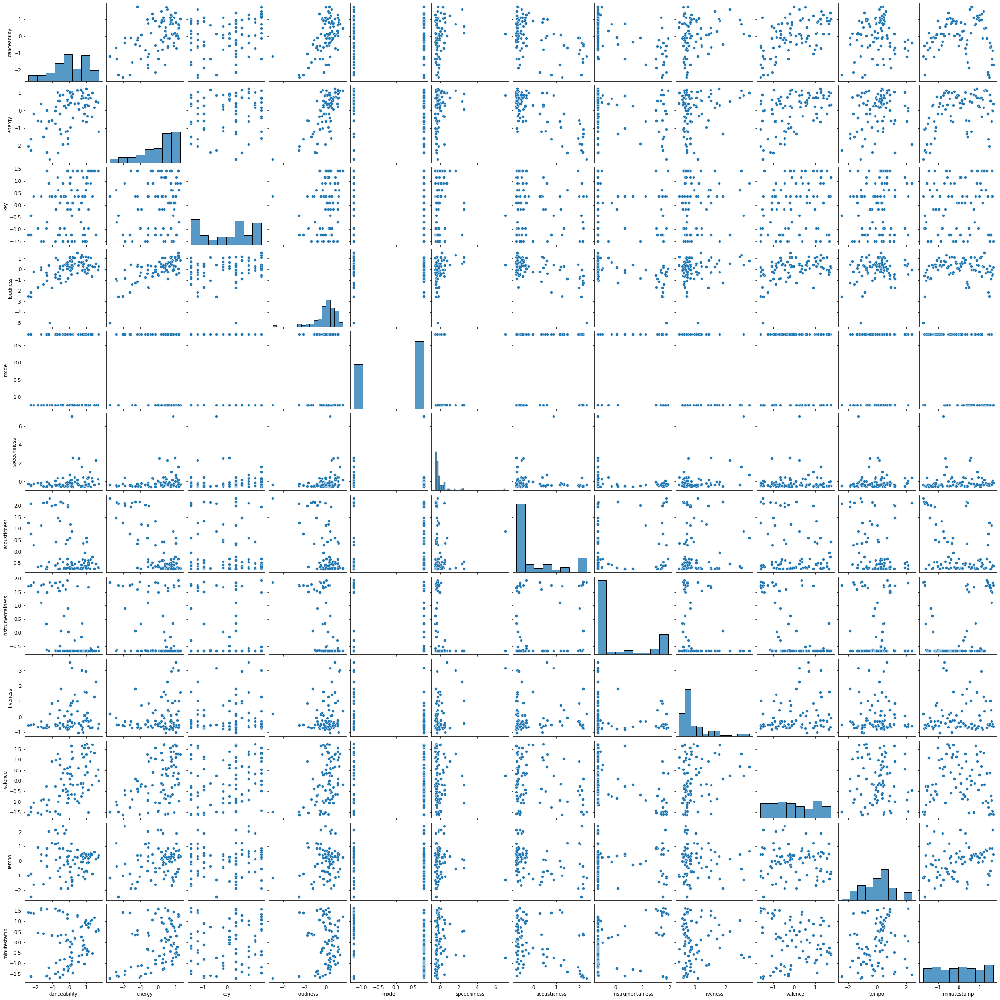

In [33]:
sns.pairplot(vis_M)

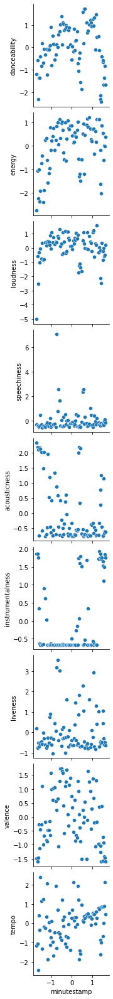

In [171]:
sns.pairplot(vis_M,y_vars=['danceability', 'energy', 'loudness',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo'],x_vars=['minutestamp']).savefig("mypcp.png")


In [35]:
PCP_M["classif_energy"] = pd.qcut(
    PCP_M["energy"], 3, labels=["LowEnergy", "MidEnergy", "HighEnergy"]
)
PCP_M["classif_dance"] = pd.qcut(
    PCP_M["danceability"], 3, labels=["NotDancy", "MidDancy", "Dancefloor"]
)
PCP_M["classif_loudness"] = pd.qcut(
    PCP_M["loudness"], 3, labels=["Quiet", "MidLoud", "Loud"]
)
PCP_M["classif_tempo"] = pd.qcut(
    PCP_M["tempo"], 3, labels=["lowTempo", "MidTempo", "HighgTempo"]
)
PCP_M["classif_speechiness"] = pd.qcut(
    PCP_M["speechiness"], 3, labels=["FewLyrics", "SomeLyrics", "LotsLyrics"]
)
PCP_M["classif_acousticness"] = pd.qcut(
    PCP_M["acousticness"], 3, labels=["NotAcoustic", "MidAcoustic", "VeryAcoustic"]
)
PCP_M["classif_instrumentalness"] = pd.qcut(
    PCP_M["instrumentalness"], 3, labels=["NotInstrumental", "MidInstrumental", "VeryInstrumental"]
)
pex.sunburst(
    PCP_M,
    path=["classif_energy","classif_dance","classif_loudness", "track.name"]
)

In [36]:
PCP_M["classif_energy"] = pd.qcut(
    PCP_M["energy"], 3, labels=["LowEnergy", "MidEnergy", "HighEnergy"]
)
PCP_M["classif_dance"] = pd.qcut(
    PCP_M["danceability"], 3, labels=["NotDancy", "MidDancy", "Dancefloor"]
)
PCP_M["classif_loudness"] = pd.qcut(
    PCP_M["loudness"], 3, labels=["Quiet", "MidLoud", "Loud"]
)
PCP_M["classif_tempo"] = pd.qcut(
    PCP_M["tempo"], 3, labels=["lowTempo", "MidTempo", "HighgTempo"]
)
PCP_M["classif_speechiness"] = pd.qcut(
    PCP_M["speechiness"], 3, labels=["FewLyrics", "SomeLyrics", "LotsLyrics"]
)
PCP_M["classif_acousticness"] = pd.qcut(
    PCP_M["acousticness"], 3, labels=["NotAcoustic", "MidAcoustic", "VeryAcoustic"]
)
PCP_M["classif_instrumentalness"] = pd.qcut(
    PCP_M["instrumentalness"], 3, labels=["NotInstrumental", "MidInstrumental", "VeryInstrumental"]
)

In [37]:
PCP_M.columns

Index(['track.name', 'danceability', 'energy', 'key', 'loudness', 'mode',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'type', 'id', 'uri', 'track_href', 'analysis_url',
       'duration_ms', 'time_signature', 'track_number_inlist', 'minutestamp',
       'original_playlist', 'classif_energy', 'classif_dance',
       'classif_loudness', 'classif_tempo', 'classif_speechiness',
       'classif_acousticness', 'classif_instrumentalness'],
      dtype='object')

In [38]:
PCP_M.isnull().sum()

track.name                  0
danceability                0
energy                      0
key                         0
loudness                    0
mode                        0
speechiness                 0
acousticness                0
instrumentalness            0
liveness                    0
valence                     0
tempo                       0
type                        0
id                          0
uri                         0
track_href                  0
analysis_url                0
duration_ms                 0
time_signature              0
track_number_inlist         0
minutestamp                 0
original_playlist           0
classif_energy              0
classif_dance               0
classif_loudness            0
classif_tempo               0
classif_speechiness         0
classif_acousticness        0
classif_instrumentalness    0
dtype: int64

In [39]:
pex.sunburst(
    PCP_M,
    path=["classif_energy","classif_dance","classif_loudness", "track.name"]
)

In [40]:
vis_M.head()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,minutestamp
0,-1.190800,-2.765517,0.361819,-5.014125,-1.230915,-0.313046,2.328962,1.863280,0.189023,-1.486780,-1.148988,-1.721934
1,-0.570137,-1.049956,-0.966986,-0.596234,0.812404,-0.423541,2.177658,1.865910,-0.767627,-1.595469,-1.058605,-1.663321
2,-2.309112,-2.257203,-0.435464,-2.523204,-1.230915,-0.440115,2.105158,1.747562,-0.519138,-1.471152,-2.446440,-1.632314
3,-1.364138,-1.003360,-0.966986,-0.318411,0.812404,-0.535417,-0.751721,0.337906,-0.717044,-0.267053,0.401577,-1.600848
4,-1.352955,-2.375810,-0.701225,-1.032780,0.812404,-0.471883,2.158745,-0.629392,-0.519138,-1.133720,-0.346022,-1.570313


In [41]:
M_pca = PCA(n_components= 2)
M_pca.fit(vis_M.drop(columns=('minutestamp')))

M= pd.DataFrame(
    M_pca.transform(vis_M.drop(columns=('minutestamp'))),
    columns=["PC" + str(i) for i in range(M_pca.n_components_)],
)

In [42]:
PCP_M

,track.name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,...,track_number_inlist,minutestamp,original_playlist,classif_energy,classif_dance,classif_loudness,classif_tempo,classif_speechiness,classif_acousticness,classif_instrumentalness
0,A Model of the Universe,0.336,0.044,7,-29.255,0,0.0456,0.98200,0.9600,0.2210,...,1,2.874067,PCP_Marathon,LowEnergy,NotDancy,Quiet,lowTempo,SomeLyrics,VeryAcoustic,VeryInstrumental
1,Experience,0.447,0.449,2,-10.634,1,0.0376,0.93400,0.9610,0.0697,...,2,8.131183,PCP_Marathon,LowEnergy,NotDancy,Quiet,lowTempo,FewLyrics,VeryAcoustic,VeryInstrumental
2,"Tchaikovsky: Swan Lake, Op. 20, Act II: No. 10...",0.136,0.164,4,-18.756,0,0.0364,0.91100,0.9160,0.1090,...,3,10.912300,PCP_Marathon,LowEnergy,NotDancy,Quiet,lowTempo,FewLyrics,VeryAcoustic,VeryInstrumental
3,La Vida Es Bella - La Vida Es Bella,0.305,0.460,2,-9.463,1,0.0295,0.00468,0.3800,0.0777,...,4,13.734517,PCP_Marathon,LowEnergy,NotDancy,Quiet,HighgTempo,FewLyrics,NotAcoustic,VeryInstrumental
4,I'm on Fire,0.307,0.136,3,-12.474,1,0.0341,0.92800,0.0122,0.1090,...,5,16.473233,PCP_Marathon,LowEnergy,NotDancy,Quiet,MidTempo,FewLyrics,VeryAcoustic,MidInstrumental
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78,To Victory,0.443,0.827,1,-11.781,1,0.0469,0.00364,0.8360,0.2610,...,79,294.419483,PCP_Marathon,MidEnergy,NotDancy,Quiet,HighgTempo,SomeLyrics,NotAcoustic,VeryInstrumental
79,The Avengers,0.250,0.553,7,-8.188,1,0.0429,0.60600,0.6730,0.1450,...,80,296.475483,PCP_Marathon,LowEnergy,NotDancy,MidLoud,MidTempo,SomeLyrics,VeryAcoustic,VeryInstrumental
80,Divine Hammer,0.307,0.701,11,-10.546,0,0.0658,0.03070,0.8170,0.0953,...,81,299.012450,PCP_Marathon,MidEnergy,NotDancy,Quiet,HighgTempo,LotsLyrics,MidAcoustic,VeryInstrumental
81,The Ritual,0.399,0.692,7,-10.190,0,0.0735,0.05090,0.9510,0.1130,...,82,301.826933,PCP_Marathon,MidEnergy,NotDancy,Quiet,HighgTempo,LotsLyrics,MidAcoustic,VeryInstrumental


In [43]:
M

,PC0,PC1
0,5.889152,1.912614
1,3.425021,-0.271889
2,5.366272,1.429602
3,1.391913,-1.271005
4,3.241513,-0.857787
...,...,...
78,1.028894,-0.162646
79,2.110185,-0.305039
80,1.327634,0.859769
81,1.279357,0.679671


In [44]:
PCP_M=pd.concat((PCP_M,M),axis=1)

In [45]:
PCP_M

,track.name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,...,original_playlist,classif_energy,classif_dance,classif_loudness,classif_tempo,classif_speechiness,classif_acousticness,classif_instrumentalness,PC0,PC1
0,A Model of the Universe,0.336,0.044,7,-29.255,0,0.0456,0.98200,0.9600,0.2210,...,PCP_Marathon,LowEnergy,NotDancy,Quiet,lowTempo,SomeLyrics,VeryAcoustic,VeryInstrumental,5.889152,1.912614
1,Experience,0.447,0.449,2,-10.634,1,0.0376,0.93400,0.9610,0.0697,...,PCP_Marathon,LowEnergy,NotDancy,Quiet,lowTempo,FewLyrics,VeryAcoustic,VeryInstrumental,3.425021,-0.271889
2,"Tchaikovsky: Swan Lake, Op. 20, Act II: No. 10...",0.136,0.164,4,-18.756,0,0.0364,0.91100,0.9160,0.1090,...,PCP_Marathon,LowEnergy,NotDancy,Quiet,lowTempo,FewLyrics,VeryAcoustic,VeryInstrumental,5.366272,1.429602
3,La Vida Es Bella - La Vida Es Bella,0.305,0.460,2,-9.463,1,0.0295,0.00468,0.3800,0.0777,...,PCP_Marathon,LowEnergy,NotDancy,Quiet,HighgTempo,FewLyrics,NotAcoustic,VeryInstrumental,1.391913,-1.271005
4,I'm on Fire,0.307,0.136,3,-12.474,1,0.0341,0.92800,0.0122,0.1090,...,PCP_Marathon,LowEnergy,NotDancy,Quiet,MidTempo,FewLyrics,VeryAcoustic,MidInstrumental,3.241513,-0.857787
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78,To Victory,0.443,0.827,1,-11.781,1,0.0469,0.00364,0.8360,0.2610,...,PCP_Marathon,MidEnergy,NotDancy,Quiet,HighgTempo,SomeLyrics,NotAcoustic,VeryInstrumental,1.028894,-0.162646
79,The Avengers,0.250,0.553,7,-8.188,1,0.0429,0.60600,0.6730,0.1450,...,PCP_Marathon,LowEnergy,NotDancy,MidLoud,MidTempo,SomeLyrics,VeryAcoustic,VeryInstrumental,2.110185,-0.305039
80,Divine Hammer,0.307,0.701,11,-10.546,0,0.0658,0.03070,0.8170,0.0953,...,PCP_Marathon,MidEnergy,NotDancy,Quiet,HighgTempo,LotsLyrics,MidAcoustic,VeryInstrumental,1.327634,0.859769
81,The Ritual,0.399,0.692,7,-10.190,0,0.0735,0.05090,0.9510,0.1130,...,PCP_Marathon,MidEnergy,NotDancy,Quiet,HighgTempo,LotsLyrics,MidAcoustic,VeryInstrumental,1.279357,0.679671


<function matplotlib.pyplot.show(close=None, block=None)>

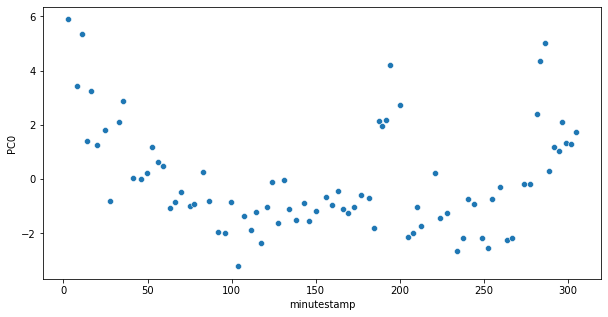

In [46]:
plt.figure(figsize=(10,5))
sns.scatterplot(data=PCP_M,x='minutestamp',y='PC0')
plt.show

In [47]:
explained_variance = M_pca.explained_variance_ratio_
cum_explained_variance = np.cumsum(explained_variance)

In [48]:
cum_explained_variance

array([0.34688776, 0.49444875])

In [49]:
vis_M.columns

Index(['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'minutestamp'],
      dtype='object')

In [50]:
vis_M=pd.concat((vis_M,M.reset_index()),axis=1)
forhm=(vis_M.corr())[['PC0','PC1']]


In [51]:
forhm

,PC0,PC1
danceability,-7.978937e-01,-5.803341e-02
energy,-8.128083e-01,1.175422e-01
key,-3.571701e-01,1.365997e-01
loudness,-8.377257e-01,-1.139950e-01
mode,8.729065e-03,-7.267249e-01
speechiness,-2.951109e-01,6.086199e-01
acousticness,6.937036e-01,1.133304e-01
instrumentalness,7.140172e-01,2.544455e-01
liveness,-3.151708e-01,7.221760e-01
valence,-6.796185e-01,-1.536982e-01


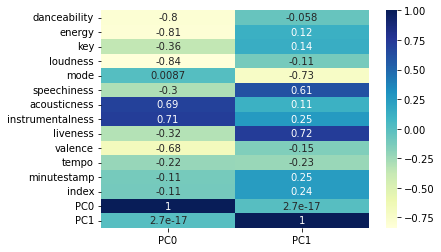

In [52]:
sns.heatmap(forhm, annot=True, cmap="YlGnBu")
plt.show()

# Visualizing & Exploration 5K

In [53]:
sfeat=['danceability', 'energy', 'key', 'loudness', 'mode',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'minutestamp']
scaler = StandardScaler()
scaler.fit(PCP_5[sfeat])


StandardScaler()

In [54]:
vis = pd.DataFrame(
    scaler.transform(PCP_5[sfeat]), columns=scaler.feature_names_in_
)

In [55]:
formelt=pd.concat((vis,PCP_5['track.name']),axis=1)


In [56]:
vis_melt = formelt.melt(id_vars=["track.name"])

<Figure size 3600x360 with 0 Axes>

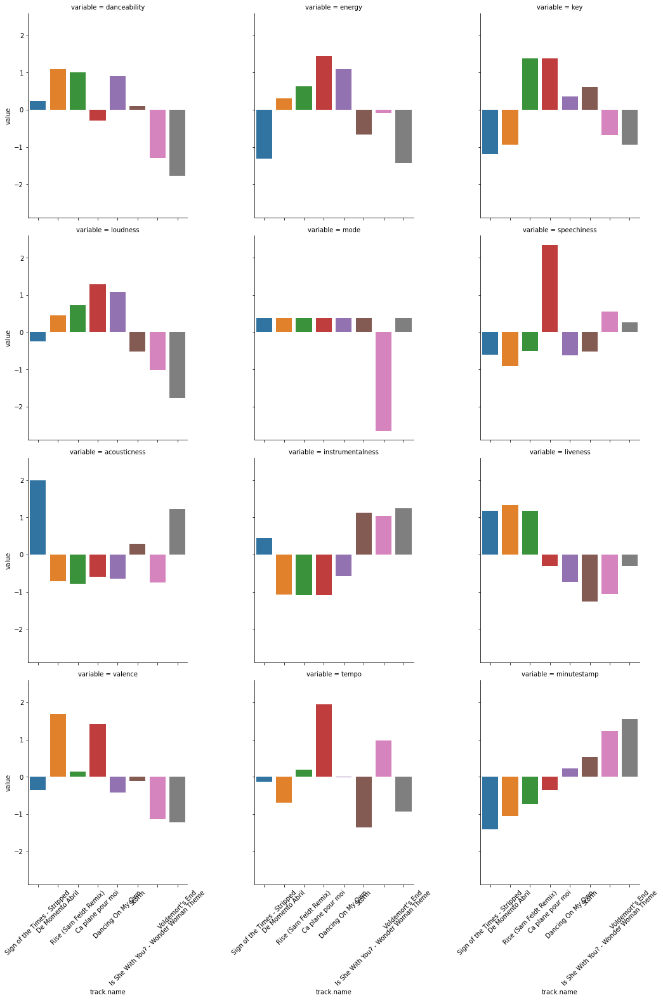

In [57]:
plt.figure(figsize=(50,5))
sns.catplot(
    data=vis_melt, 
    x="track.name", y="value",
    col="variable", kind="bar", 
    col_wrap=3
).set_xticklabels(formelt['track.name'],rotation=45)

In [58]:
formelt.head()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,minutestamp,track.name
0,0.240733,-1.308639,-1.194792,-0.253452,0.377964,-0.598207,1.989338,0.446197,1.175966,-0.360056,-0.132005,-1.415669,Sign of the Times - Stripped
1,1.083896,0.309026,-0.936459,0.444475,0.377964,-0.920507,-0.718212,-1.073149,1.332696,1.689750,-0.692639,-1.045558,De Momento Abril
2,1.012036,0.634943,1.388542,0.730476,0.377964,-0.500541,-0.783242,-1.096786,1.175966,0.149959,0.191868,-0.719463,Rise (Sam Feldt Remix)
3,-0.295826,1.441788,1.388542,1.286470,0.377964,2.346437,-0.595840,-1.096609,-0.312970,1.416876,1.946630,-0.354062,Ca plane pour moi
4,0.911431,1.099972,0.355209,1.080933,0.377964,-0.622624,-0.654463,-0.589362,-0.736142,-0.425026,-0.009770,0.219429,Dancing On My Own


<function matplotlib.pyplot.show(close=None, block=None)>

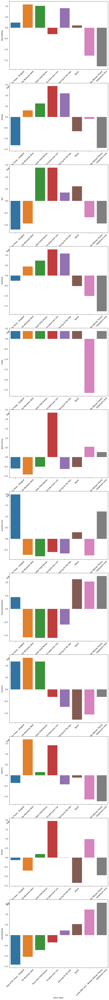

In [59]:
fig, ax = plt.subplots(12, 1, figsize = (10,100))
sns.barplot(data=formelt, x='track.name', y="danceability", ax = ax[0]).set_xticklabels(formelt['track.name'],rotation=45)
sns.barplot(data=formelt, x='track.name', y="energy", ax = ax[1]).set_xticklabels(formelt['track.name'],rotation=45)
sns.barplot(data=formelt, x='track.name', y="key", ax = ax[2]).set_xticklabels(formelt['track.name'],rotation=45)
sns.barplot(data=formelt, x='track.name', y="loudness", ax = ax[3]).set_xticklabels(formelt['track.name'],rotation=45)
sns.barplot(data=formelt, x='track.name', y="mode", ax = ax[4]).set_xticklabels(formelt['track.name'],rotation=45)
sns.barplot(data=formelt, x='track.name', y="speechiness", ax = ax[5]).set_xticklabels(formelt['track.name'],rotation=45)
sns.barplot(data=formelt, x='track.name', y="acousticness", ax = ax[6]).set_xticklabels(formelt['track.name'],rotation=45)
sns.barplot(data=formelt, x='track.name', y="instrumentalness", ax = ax[7]).set_xticklabels(formelt['track.name'],rotation=45)
sns.barplot(data=formelt, x='track.name', y="liveness", ax = ax[8]).set_xticklabels(formelt['track.name'],rotation=45)
sns.barplot(data=formelt, x='track.name', y="valence", ax = ax[9]).set_xticklabels(formelt['track.name'],rotation=45)
sns.barplot(data=formelt, x='track.name', y="tempo", ax = ax[10]).set_xticklabels(formelt['track.name'],rotation=45)
sns.barplot(data=formelt, x='track.name', y="minutestamp", ax = ax[11]).set_xticklabels(formelt['track.name'],rotation=45)
plt.show



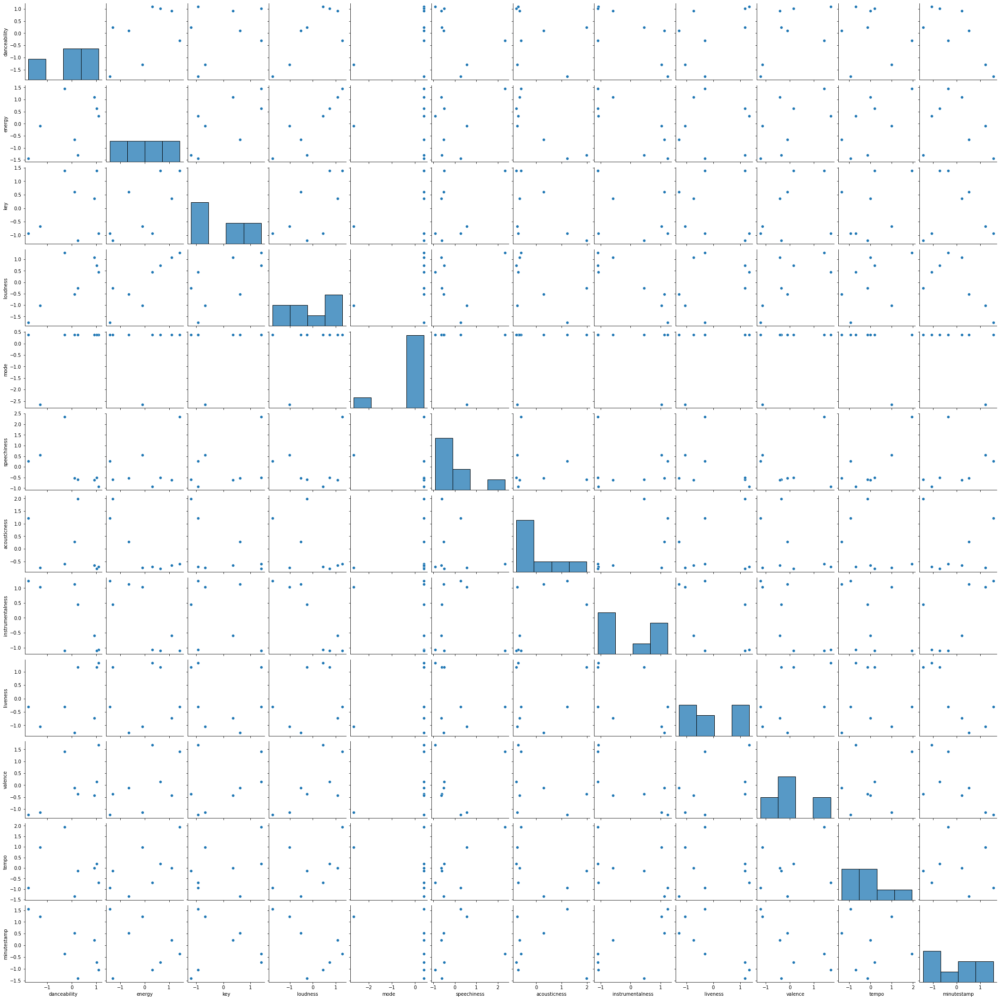

In [60]:
sns.pairplot(vis)

In [61]:
PCP_5["classif_energy"] = pd.qcut(
    PCP_5["energy"], 3, labels=["LowEnergy", "MidEnergy", "HighEnergy"]
)
PCP_5["classif_dance"] = pd.qcut(
    PCP_5["danceability"], 3, labels=["NotDancy", "MidDancy", "Dancefloor"]
)
PCP_5["classif_loudness"] = pd.qcut(
    PCP_5["loudness"], 3, labels=["Quiet", "MidLoud", "Loud"]
)
PCP_5["classif_tempo"] = pd.qcut(
    PCP_5["tempo"], 3, labels=["lowTempo", "MidTempo", "HighgTempo"]
)


In [62]:
pex.sunburst(
    PCP_5,
    path=["classif_tempo","classif_energy", "classif_dance", "classif_loudness", "track.name"]
)


In [63]:
PCP_5["classif_speechiness"] = pd.qcut(
    PCP_5["speechiness"], 3, labels=["FewLyrics", "SomeLyrics", "LotsLyrics"]
)
PCP_5["classif_acousticness"] = pd.qcut(
    PCP_5["acousticness"], 3, labels=["NotAcoustic", "MidAcoustic", "VeryAcoustic"]
)
PCP_5["classif_instrumentalness"] = pd.qcut(
    PCP_5["instrumentalness"], 3, labels=["NotInstrumental", "MidInstrumental", "VeryInstrumental"]
)

In [64]:
pex.sunburst(
    PCP_5,
    path=["classif_speechiness","classif_acousticness", "classif_instrumentalness", "track.name"]
)

In [65]:
PCP_5.head()

,track.name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,...,track_number_inlist,minutestamp,original_playlist,classif_energy,classif_dance,classif_loudness,classif_tempo,classif_speechiness,classif_acousticness,classif_instrumentalness
0,Sign of the Times - Stripped,0.534,0.251,0,-11.580,1,0.0351,0.8810,0.596000,0.1430,...,1,2.657567,PCP_5K,LowEnergy,MidDancy,MidLoud,MidTempo,FewLyrics,VeryAcoustic,MidInstrumental
1,De Momento Abril,0.710,0.658,1,-8.310,1,0.0285,0.0358,0.009130,0.1470,...,2,5.732233,PCP_5K,MidEnergy,Dancefloor,MidLoud,lowTempo,FewLyrics,NotAcoustic,NotInstrumental
2,Rise (Sam Feldt Remix),0.695,0.740,10,-6.970,1,0.0371,0.0155,0.000000,0.1430,...,3,8.441250,PCP_5K,HighEnergy,Dancefloor,Loud,HighgTempo,SomeLyrics,NotAcoustic,NotInstrumental
3,Ca plane pour moi,0.422,0.943,10,-4.365,1,0.0954,0.0740,0.000068,0.1050,...,4,11.476800,PCP_5K,HighEnergy,NotDancy,Loud,HighgTempo,LotsLyrics,MidAcoustic,NotInstrumental
4,Dancing On My Own,0.674,0.857,6,-5.328,1,0.0346,0.0557,0.196000,0.0942,...,5,16.241033,PCP_5K,HighEnergy,Dancefloor,Loud,MidTempo,FewLyrics,MidAcoustic,MidInstrumental


In [66]:
vis.columns

Index(['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'minutestamp'],
      dtype='object')

In [67]:
K5_pca = PCA(n_components= 2)
K5_pca.fit(vis.drop(columns=('minutestamp')))

K5 = pd.DataFrame(
    K5_pca.transform(vis.drop(columns=('minutestamp'))),
    columns=["PC" + str(i) for i in range(K5_pca.n_components_)],
)

In [68]:
K5=K5.set_index(PCP_5['track.name'])
K5

,PC0,PC1
track.name,,
Sign of the Times - Stripped,1.706382,-1.848363
De Momento Abril,-1.600999,-2.117924
Rise (Sam Feldt Remix),-2.240792,-0.784734
Ca plane pour moi,-3.224312,2.283023
Dancing On My Own,-1.476545,-0.117321
Storm,1.317197,-0.408054
Is She With You? - Wonder Woman Theme,1.895733,2.961193
Voldemort's End,3.623337,0.032180


In [69]:
PCP_5=pd.concat((PCP_5,K5.reset_index()),axis=1)

In [70]:
PCP_5['minutestamp']

0     2.657567
1     5.732233
2     8.441250
3    11.476800
4    16.241033
5    18.833750
6    24.612817
7    27.349700
Name: minutestamp, dtype: float64

<function matplotlib.pyplot.show(close=None, block=None)>

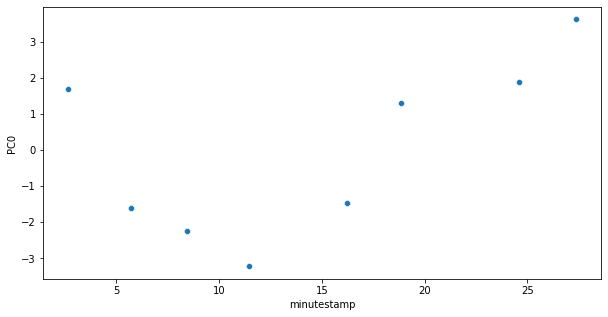

In [71]:
plt.figure(figsize=(10,5))
sns.scatterplot(data=PCP_5,x='minutestamp',y='PC0')
plt.show

In [141]:
PCP_5.drop(columns=('track.name'),inplace=True)

KeyError: "['track.name'] not found in axis"

In [142]:
PCP_5['track.name']=K5['track.name']
PCP_5

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,...,classif_energy,classif_dance,classif_loudness,classif_tempo,classif_speechiness,classif_acousticness,classif_instrumentalness,PC0,PC1,track.name
0,0.534,0.251,0,-11.580,1,0.0351,0.8810,0.596000,0.1430,0.2980,...,LowEnergy,MidDancy,MidLoud,MidTempo,FewLyrics,VeryAcoustic,MidInstrumental,1.706382,-1.848363,Sign of the Times - Stripped
1,0.710,0.658,1,-8.310,1,0.0285,0.0358,0.009130,0.1470,0.9290,...,MidEnergy,Dancefloor,MidLoud,lowTempo,FewLyrics,NotAcoustic,NotInstrumental,-1.600999,-2.117924,De Momento Abril
2,0.695,0.740,10,-6.970,1,0.0371,0.0155,0.000000,0.1430,0.4550,...,HighEnergy,Dancefloor,Loud,HighgTempo,SomeLyrics,NotAcoustic,NotInstrumental,-2.240792,-0.784734,Rise (Sam Feldt Remix)
3,0.422,0.943,10,-4.365,1,0.0954,0.0740,0.000068,0.1050,0.8450,...,HighEnergy,NotDancy,Loud,HighgTempo,LotsLyrics,MidAcoustic,NotInstrumental,-3.224312,2.283023,Ca plane pour moi
4,0.674,0.857,6,-5.328,1,0.0346,0.0557,0.196000,0.0942,0.2780,...,HighEnergy,Dancefloor,Loud,MidTempo,FewLyrics,MidAcoustic,MidInstrumental,-1.476545,-0.117321,Dancing On My Own
5,0.507,0.415,7,-12.832,1,0.0366,0.3500,0.859000,0.0806,0.3750,...,LowEnergy,MidDancy,Quiet,lowTempo,SomeLyrics,VeryAcoustic,VeryInstrumental,1.317197,-0.408054,Storm
6,0.215,0.559,2,-15.129,0,0.0586,0.0270,0.825000,0.0861,0.0588,...,MidEnergy,NotDancy,Quiet,HighgTempo,LotsLyrics,NotAcoustic,VeryInstrumental,1.895733,2.961193,Is She With You? - Wonder Woman Theme
7,0.113,0.219,1,-18.626,1,0.0529,0.6410,0.904000,0.1050,0.0319,...,LowEnergy,NotDancy,Quiet,lowTempo,LotsLyrics,VeryAcoustic,VeryInstrumental,3.623337,0.032180,Voldemort's End


# PCA METHOD

Bring in your play list. 

In [72]:
PCP_M_link='https://open.spotify.com/playlist/2CPap0lQiK320ROUnBzxKk'
marathon=playlisttodf(PCP_M_link)

In [73]:
marathon.head()

,track.name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,...,type,id,uri,track_href,analysis_url,duration_ms,time_signature,track_number_inlist,minutestamp,original_playlist
0,A Model of the Universe,0.336,0.044,7,-29.255,0,0.0456,0.98200,0.9600,0.2210,...,audio_features,5ay0cvjtVAbMLOe8gTadFh,spotify:track:5ay0cvjtVAbMLOe8gTadFh,https://api.spotify.com/v1/tracks/5ay0cvjtVAbM...,https://api.spotify.com/v1/audio-analysis/5ay0...,172444,4,1,2.874067,PCP_Marathon
1,Experience,0.447,0.449,2,-10.634,1,0.0376,0.93400,0.9610,0.0697,...,audio_features,1BncfTJAWxrsxyT9culBrj,spotify:track:1BncfTJAWxrsxyT9culBrj,https://api.spotify.com/v1/tracks/1BncfTJAWxrs...,https://api.spotify.com/v1/audio-analysis/1Bnc...,315427,4,2,8.131183,PCP_Marathon
2,"Tchaikovsky: Swan Lake, Op. 20, Act II: No. 10...",0.136,0.164,4,-18.756,0,0.0364,0.91100,0.9160,0.1090,...,audio_features,2xizRhme7pYeITbH1NLLGt,spotify:track:2xizRhme7pYeITbH1NLLGt,https://api.spotify.com/v1/tracks/2xizRhme7pYe...,https://api.spotify.com/v1/audio-analysis/2xiz...,166867,4,3,10.912300,PCP_Marathon
3,La Vida Es Bella - La Vida Es Bella,0.305,0.460,2,-9.463,1,0.0295,0.00468,0.3800,0.0777,...,audio_features,5sgRJe0Z1ol9wvSSsXcGaf,spotify:track:5sgRJe0Z1ol9wvSSsXcGaf,https://api.spotify.com/v1/tracks/5sgRJe0Z1ol9...,https://api.spotify.com/v1/audio-analysis/5sgR...,169333,4,4,13.734517,PCP_Marathon
4,I'm on Fire,0.307,0.136,3,-12.474,1,0.0341,0.92800,0.0122,0.1090,...,audio_features,7uMVMpAmxxq44QskyMoUU9,spotify:track:7uMVMpAmxxq44QskyMoUU9,https://api.spotify.com/v1/tracks/7uMVMpAmxxq4...,https://api.spotify.com/v1/audio-analysis/7uMV...,164323,3,5,16.473233,PCP_Marathon


Standarize your existing features.

In [74]:
sfeat=['danceability', 'energy', 'loudness','speechiness',
       'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo']
scaler = StandardScaler()
scaler.fit(marathon[sfeat])
marathon_sca = pd.DataFrame(
    scaler.transform(marathon[sfeat]), columns=scaler.feature_names_in_
)

In [75]:
marathon_sca.head()

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
0,-1.190800,-2.765517,-5.014125,-0.313046,2.328962,1.863280,0.189023,-1.486780,-1.148988
1,-0.570137,-1.049956,-0.596234,-0.423541,2.177658,1.865910,-0.767627,-1.595469,-1.058605
2,-2.309112,-2.257203,-2.523204,-0.440115,2.105158,1.747562,-0.519138,-1.471152,-2.446440
3,-1.364138,-1.003360,-0.318411,-0.535417,-0.751721,0.337906,-0.717044,-0.267053,0.401577
4,-1.352955,-2.375810,-1.032780,-0.471883,2.158745,-0.629392,-0.519138,-1.133720,-0.346022


Do PCA on your features to find an underlying relationship to time. 

Fit the PCA to your perfectly crafted playlist. 

In [76]:
Marathon_pca = PCA(n_components= 2)
Marathon_pca.fit(marathon_sca)

PCA(n_components=2)

Apply the PCA and transform your pcp marathon but also to the entire df of liked songs. 

In [77]:
Marathon_transformed= pd.DataFrame(
    Marathon_pca.transform(marathon_sca),
    columns=["PC" + str(i) for i in range(M_pca.n_components_)],
)

In [78]:
Marathon_transformed

,PC0,PC1
0,6.072221,1.669228
1,3.299471,0.372181
2,5.379775,1.365467
3,1.230501,-1.127401
4,3.170219,0.733769
...,...,...
78,0.807953,-0.878828
79,2.204976,-0.173843
80,1.611696,-1.363684
81,1.368891,-1.803315


Put them together

In [79]:
MARATHON=pd.concat((marathon,Marathon_transformed),axis=1)

In [80]:
MARATHON.head()

,track.name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,...,uri,track_href,analysis_url,duration_ms,time_signature,track_number_inlist,minutestamp,original_playlist,PC0,PC1
0,A Model of the Universe,0.336,0.044,7,-29.255,0,0.0456,0.98200,0.9600,0.2210,...,spotify:track:5ay0cvjtVAbMLOe8gTadFh,https://api.spotify.com/v1/tracks/5ay0cvjtVAbM...,https://api.spotify.com/v1/audio-analysis/5ay0...,172444,4,1,2.874067,PCP_Marathon,6.072221,1.669228
1,Experience,0.447,0.449,2,-10.634,1,0.0376,0.93400,0.9610,0.0697,...,spotify:track:1BncfTJAWxrsxyT9culBrj,https://api.spotify.com/v1/tracks/1BncfTJAWxrs...,https://api.spotify.com/v1/audio-analysis/1Bnc...,315427,4,2,8.131183,PCP_Marathon,3.299471,0.372181
2,"Tchaikovsky: Swan Lake, Op. 20, Act II: No. 10...",0.136,0.164,4,-18.756,0,0.0364,0.91100,0.9160,0.1090,...,spotify:track:2xizRhme7pYeITbH1NLLGt,https://api.spotify.com/v1/tracks/2xizRhme7pYe...,https://api.spotify.com/v1/audio-analysis/2xiz...,166867,4,3,10.912300,PCP_Marathon,5.379775,1.365467
3,La Vida Es Bella - La Vida Es Bella,0.305,0.460,2,-9.463,1,0.0295,0.00468,0.3800,0.0777,...,spotify:track:5sgRJe0Z1ol9wvSSsXcGaf,https://api.spotify.com/v1/tracks/5sgRJe0Z1ol9...,https://api.spotify.com/v1/audio-analysis/5sgR...,169333,4,4,13.734517,PCP_Marathon,1.230501,-1.127401
4,I'm on Fire,0.307,0.136,3,-12.474,1,0.0341,0.92800,0.0122,0.1090,...,spotify:track:7uMVMpAmxxq44QskyMoUU9,https://api.spotify.com/v1/tracks/7uMVMpAmxxq4...,https://api.spotify.com/v1/audio-analysis/7uMV...,164323,3,5,16.473233,PCP_Marathon,3.170219,0.733769


<function matplotlib.pyplot.show(close=None, block=None)>

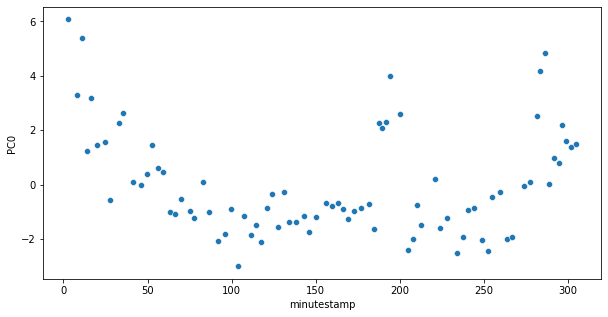

In [81]:
plt.figure(figsize=(10,5))
sns.scatterplot(data=MARATHON,x='minutestamp',y='PC0')
plt.show

Finding whether there is a statisticaly significant difference between the mean PCs scores per 20 min interval for both PC0 and PC1 to validate the use of PCs

In [82]:
MARATHON

,track.name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,...,uri,track_href,analysis_url,duration_ms,time_signature,track_number_inlist,minutestamp,original_playlist,PC0,PC1
0,A Model of the Universe,0.336,0.044,7,-29.255,0,0.0456,0.98200,0.9600,0.2210,...,spotify:track:5ay0cvjtVAbMLOe8gTadFh,https://api.spotify.com/v1/tracks/5ay0cvjtVAbM...,https://api.spotify.com/v1/audio-analysis/5ay0...,172444,4,1,2.874067,PCP_Marathon,6.072221,1.669228
1,Experience,0.447,0.449,2,-10.634,1,0.0376,0.93400,0.9610,0.0697,...,spotify:track:1BncfTJAWxrsxyT9culBrj,https://api.spotify.com/v1/tracks/1BncfTJAWxrs...,https://api.spotify.com/v1/audio-analysis/1Bnc...,315427,4,2,8.131183,PCP_Marathon,3.299471,0.372181
2,"Tchaikovsky: Swan Lake, Op. 20, Act II: No. 10...",0.136,0.164,4,-18.756,0,0.0364,0.91100,0.9160,0.1090,...,spotify:track:2xizRhme7pYeITbH1NLLGt,https://api.spotify.com/v1/tracks/2xizRhme7pYe...,https://api.spotify.com/v1/audio-analysis/2xiz...,166867,4,3,10.912300,PCP_Marathon,5.379775,1.365467
3,La Vida Es Bella - La Vida Es Bella,0.305,0.460,2,-9.463,1,0.0295,0.00468,0.3800,0.0777,...,spotify:track:5sgRJe0Z1ol9wvSSsXcGaf,https://api.spotify.com/v1/tracks/5sgRJe0Z1ol9...,https://api.spotify.com/v1/audio-analysis/5sgR...,169333,4,4,13.734517,PCP_Marathon,1.230501,-1.127401
4,I'm on Fire,0.307,0.136,3,-12.474,1,0.0341,0.92800,0.0122,0.1090,...,spotify:track:7uMVMpAmxxq44QskyMoUU9,https://api.spotify.com/v1/tracks/7uMVMpAmxxq4...,https://api.spotify.com/v1/audio-analysis/7uMV...,164323,3,5,16.473233,PCP_Marathon,3.170219,0.733769
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78,To Victory,0.443,0.827,1,-11.781,1,0.0469,0.00364,0.8360,0.2610,...,spotify:track:0PQfyDuJBxQhx3NTUsAYiC,https://api.spotify.com/v1/tracks/0PQfyDuJBxQh...,https://api.spotify.com/v1/audio-analysis/0PQf...,153720,1,79,294.419483,PCP_Marathon,0.807953,-0.878828
79,The Avengers,0.250,0.553,7,-8.188,1,0.0429,0.60600,0.6730,0.1450,...,spotify:track:5SXsXjVJCWeJuf7FHvgBYR,https://api.spotify.com/v1/tracks/5SXsXjVJCWeJ...,https://api.spotify.com/v1/audio-analysis/5SXs...,123360,4,80,296.475483,PCP_Marathon,2.204976,-0.173843
80,Divine Hammer,0.307,0.701,11,-10.546,0,0.0658,0.03070,0.8170,0.0953,...,spotify:track:16t3wvIODRjSJQchL432vG,https://api.spotify.com/v1/tracks/16t3wvIODRjS...,https://api.spotify.com/v1/audio-analysis/16t3...,152218,4,81,299.012450,PCP_Marathon,1.611696,-1.363684
81,The Ritual,0.399,0.692,7,-10.190,0,0.0735,0.05090,0.9510,0.1130,...,spotify:track:3g68Xeeg1mei9te90np4iw,https://api.spotify.com/v1/tracks/3g68Xeeg1mei...,https://api.spotify.com/v1/audio-analysis/3g68...,168869,4,82,301.826933,PCP_Marathon,1.368891,-1.803315


In [83]:
bins=pd.cut(MARATHON['minutestamp'],bins=15)

In [84]:
MARATHON['bins']=bins

In [85]:
for_z=MARATHON.groupby('bins').mean()[['PC0','PC1']]
for_z

,PC0,PC1
bins,,
"(2.573, 22.977]",3.433196,0.486901
"(22.977, 43.081]",1.203313,-0.074447
"(43.081, 63.184]",0.586034,-0.089475
"(63.184, 83.288]",-0.783747,0.156887
"(83.288, 103.391]",-1.449609,2.130062
"(103.391, 123.495]",-1.740272,0.341962
"(123.495, 143.598]",-1.016878,0.154581
"(143.598, 163.701]",-1.001551,-0.755871
"(163.701, 183.805]",-0.932919,-0.381907


In [86]:
for i in list(for_z['PC0']):
    print(ztest(for_z['PC0'], value=i))

(-8.563271471220668, 1.0970920548176359e-17)
(-3.144245788061558, 0.0016651551646706612)
(-1.64414353127672, 0.10014655790538146)
(1.6846767272411485, 0.09205095900013546)
(3.302843746451377, 0.0009570970255682909)
(4.009206647667284, 6.09230852106947e-05)
(2.251226218584833, 0.02437121310823136)
(2.2139792293151643, 0.02683020779318426)
(2.0471913337989585, 0.0406393020000441)
(-4.930546226452797, 8.200000921697853e-07)
(2.8907342771639715, 0.00384342942013568)
(3.4307111737641014, 0.0006020012000865755)
(3.288194535077079, 0.0010083213953805104)
(-2.5575700837979842, 0.010540631572564685)
(-4.278986788254192, 1.8774600541403427e-05)


<function matplotlib.pyplot.show(close=None, block=None)>

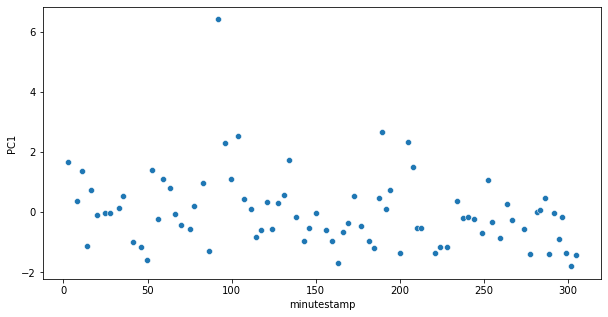

In [87]:
plt.figure(figsize=(10,5))
sns.scatterplot(data=MARATHON,x='minutestamp',y='PC1')
plt.show

In [88]:
for i in list(for_z['PC1']):
    print(ztest(for_z['PC1'], value=i))

(-2.430978764631182, 0.015058097076510664)
(0.682434491488479, 0.49496425217517115)
(0.7657807120682412, 0.44380679266204226)
(-0.6006151569063334, 0.5480963403439476)
(-11.54445018739292, 7.87433808318677e-31)
(-1.6271005897138737, 0.10371573581869017)
(-0.5878266311467477, 0.5566486668123871)
(4.461820912730529, 8.126613039675528e-06)
(2.3877028704188685, 0.016954042658814106)
(-1.0614549586141069, 0.2884831919197963)
(-1.3666041420393318, 0.1717494182275261)
(2.567821144301465, 0.010233994442452063)
(0.8773385924692498, 0.3803027563233704)
(2.620663802135263, 0.00877587593062979)
(4.855467904832399, 1.201028069273516e-06)


In [89]:
variance = Marathon_pca.explained_variance_ratio_
cum_variance = np.cumsum(variance)
cum_variance

array([0.4132006 , 0.57997396])

In [90]:
marathon_sca_pca=pd.concat((marathon_sca,Marathon_transformed,),axis=1)

In [91]:
marathon_sca_pca.corr()[['PC0','PC1']]


,PC0,PC1
danceability,-7.933523e-01,6.117442e-02
energy,-8.235700e-01,-1.678783e-01
loudness,-8.436269e-01,-1.047598e-01
speechiness,-3.009125e-01,6.466929e-01
acousticness,6.999940e-01,4.555644e-01
instrumentalness,7.147086e-01,-1.684972e-01
liveness,-3.159791e-01,7.042205e-01
valence,-6.781040e-01,1.162753e-01
tempo,-2.200171e-01,-5.426525e-01
PC0,1.000000e+00,9.058698e-17


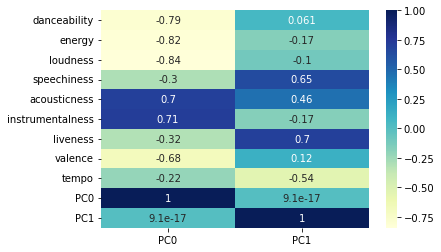

In [92]:
sns.heatmap((marathon_sca_pca.corr()[['PC0','PC1']]), annot=True, cmap="YlGnBu")
plt.show()

Visualize these songs with the most relevant features per PC

In [93]:
marathon["classif_energy"] = pd.qcut(
    marathon["energy"], 3, labels=["LowEnergy", "MidEnergy", "HighEnergy"]
)
marathon["classif_dance"] = pd.qcut(
    marathon["danceability"], 3, labels=["NotDancy", "MidDancy", "Dancefloor"]
)
marathon["classif_loudness"] = pd.qcut(
    marathon["loudness"], 3, labels=["Quiet", "MidLoud", "Loud"]
)
marathon["classif_tempo"] = pd.qcut(
    marathon["tempo"], 3, labels=["LowTempo", "MidTempo", "HighTempo"]
)
marathon["classif_speechiness"] = pd.qcut(
    marathon["speechiness"], 3, labels=["FewLyrics", "SomeLyrics", "ManyLyrics"]
)
marathon["classif_acousticness"] = pd.qcut(
    marathon["acousticness"], 3, labels=["NotAcoustic", "MidAcoustic", "VeryAcoustic"]
)



PC0

In [94]:
pex.sunburst(
    marathon,
    path=["classif_loudness","classif_energy","classif_dance","classif_acousticness", "track.name"]
)

PC1

In [95]:
pex.sunburst(
    marathon,
    path=["classif_speechiness","classif_tempo","classif_acousticness", "track.name"]
)

Bring in your liked songs

In [96]:
liked_songs=['https://open.spotify.com/playlist/0ygkDmQU8WKFHsR7LwiztI',
             'https://open.spotify.com/playlist/4GxGb7D4ct1JT8iQu9fBY8',
             'https://open.spotify.com/playlist/1vfXcHY6EmmJYhEOQcZfKJ',
             'https://open.spotify.com/playlist/6tetitu7NqbFwNqADgUUQy',
             'https://open.spotify.com/playlist/5sPnLfRFNK9SIDiq6HAjZ9',
             'https://open.spotify.com/playlist/7seGteU0tGuKqVtxT5brg5']

In [97]:
liked=pd.DataFrame()
for i in liked_songs:
    y=playlisttodf(i)
    liked=pd.concat((liked,y))

In [98]:
liked

,track.name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,...,type,id,uri,track_href,analysis_url,duration_ms,time_signature,track_number_inlist,minutestamp,original_playlist
0,Put Your Head on My Shoulder,0.549,0.433,7,-8.526,1,0.0327,0.9060,0.010800,0.0774,...,audio_features,7eqNATKM78MkWP6aHGXHEV,spotify:track:7eqNATKM78MkWP6aHGXHEV,https://api.spotify.com/v1/tracks/7eqNATKM78Mk...,https://api.spotify.com/v1/audio-analysis/7eqN...,155080,3,1,2.584667,liked1
1,Padam padam,0.385,0.283,5,-8.013,0,0.0546,0.7800,0.000000,0.0726,...,audio_features,194uD6fRM58ztn7Z1Mfyr2,spotify:track:194uD6fRM58ztn7Z1Mfyr2,https://api.spotify.com/v1/tracks/194uD6fRM58z...,https://api.spotify.com/v1/audio-analysis/194u...,197627,3,2,5.878450,liked1
2,J'm'en fous pas mal,0.427,0.374,5,-9.925,0,0.0759,0.9800,0.000000,0.3820,...,audio_features,5lGe7LrFSl53vbL1N2p5nt,spotify:track:5lGe7LrFSl53vbL1N2p5nt,https://api.spotify.com/v1/tracks/5lGe7LrFSl53...,https://api.spotify.com/v1/audio-analysis/5lGe...,260120,3,3,10.213783,liked1
3,Heureuse,0.289,0.218,0,-8.587,1,0.0387,0.9640,0.000132,0.1320,...,audio_features,5NvtYYIYViQ2uV0fzoBTIi,spotify:track:5NvtYYIYViQ2uV0fzoBTIi,https://api.spotify.com/v1/tracks/5NvtYYIYViQ2...,https://api.spotify.com/v1/audio-analysis/5Nvt...,197973,3,4,13.513333,liked1
4,Exodus,0.258,0.357,8,-8.713,0,0.0294,0.7890,0.000007,0.0812,...,audio_features,7pgAZyxlGqmFlGp7zeY9iz,spotify:track:7pgAZyxlGqmFlGp7zeY9iz,https://api.spotify.com/v1/tracks/7pgAZyxlGqmF...,https://api.spotify.com/v1/audio-analysis/7pgA...,210333,4,5,17.018883,liked1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13,Mystery of Love,0.365,0.273,4,-16.526,0,0.0380,0.9400,0.431000,0.1090,...,audio_features,0MNNKSUU9OOQ8DSGWduw79,spotify:track:0MNNKSUU9OOQ8DSGWduw79,https://api.spotify.com/v1/tracks/0MNNKSUU9OOQ...,https://api.spotify.com/v1/audio-analysis/0MNN...,248965,5,14,53.808967,liked6
14,Apocalypse,0.370,0.467,5,-9.013,1,0.0273,0.0205,0.572000,0.1090,...,audio_features,0yc6Gst2xkRu0eMLeRMGCX,spotify:track:0yc6Gst2xkRu0eMLeRMGCX,https://api.spotify.com/v1/tracks/0yc6Gst2xkRu...,https://api.spotify.com/v1/audio-analysis/0yc6...,290617,4,15,58.652583,liked6
15,"Vivaldi: The Four Seasons, Violin Concerto in ...",0.362,0.569,7,-15.394,0,0.0345,0.8760,0.910000,0.3270,...,audio_features,2nnXe7n3Vivs7OfQKRsfWD,spotify:track:2nnXe7n3Vivs7OfQKRsfWD,https://api.spotify.com/v1/tracks/2nnXe7n3Vivs...,https://api.spotify.com/v1/audio-analysis/2nnX...,173427,3,16,61.543033,liked6
16,Experience,0.447,0.449,2,-10.634,1,0.0376,0.9340,0.961000,0.0697,...,audio_features,1BncfTJAWxrsxyT9culBrj,spotify:track:1BncfTJAWxrsxyT9culBrj,https://api.spotify.com/v1/tracks/1BncfTJAWxrs...,https://api.spotify.com/v1/audio-analysis/1Bnc...,315427,4,17,66.800150,liked6


In [99]:
sfeat=['danceability', 'energy', 'loudness','speechiness',
       'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo']
scaler = StandardScaler()
scaler.fit(liked[sfeat])
liked_sca = pd.DataFrame(
    scaler.transform(liked[sfeat]), columns=scaler.feature_names_in_
)

In [100]:
liked_sca.head()

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
0,0.388309,-0.230513,0.285968,-0.381685,1.259694,-0.546958,-0.674814,0.364651,-0.052190
1,-0.456634,-0.824704,0.393833,0.096792,0.897928,-0.577957,-0.706071,0.627903,2.145784
2,-0.240246,-0.464228,-0.008190,0.562159,1.472159,-0.577957,1.308673,0.179262,-1.331662
3,-0.951234,-1.082187,0.273142,-0.250596,1.426221,-0.577578,-0.319271,-1.014643,-0.279159
4,-1.110949,-0.531569,0.246649,-0.453784,0.923769,-0.577936,-0.650069,-0.606787,-0.800684


In [101]:
liked_transformed= pd.DataFrame(
    Marathon_pca.transform(liked_sca),
    columns=["PC" + str(i) for i in range(M_pca.n_components_)],
)

In [102]:
liked_transformed

,PC0,PC1
0,0.115993,0.038524
1,0.114489,-0.775697
2,0.407598,2.335049
3,1.517708,0.398762
4,1.179329,0.103125
...,...,...
512,2.202472,-0.064290
513,0.623117,-0.904118
514,1.098995,0.199248
515,2.210466,-0.072432


In [103]:
like_pca=pd.concat((liked.reset_index(),liked_transformed),axis=1)

In [104]:
like_pca.drop(columns=('index'),inplace=True)
like_pca.head()

,track.name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,...,uri,track_href,analysis_url,duration_ms,time_signature,track_number_inlist,minutestamp,original_playlist,PC0,PC1
0,Put Your Head on My Shoulder,0.549,0.433,7,-8.526,1,0.0327,0.906,0.010800,0.0774,...,spotify:track:7eqNATKM78MkWP6aHGXHEV,https://api.spotify.com/v1/tracks/7eqNATKM78Mk...,https://api.spotify.com/v1/audio-analysis/7eqN...,155080,3,1,2.584667,liked1,0.115993,0.038524
1,Padam padam,0.385,0.283,5,-8.013,0,0.0546,0.780,0.000000,0.0726,...,spotify:track:194uD6fRM58ztn7Z1Mfyr2,https://api.spotify.com/v1/tracks/194uD6fRM58z...,https://api.spotify.com/v1/audio-analysis/194u...,197627,3,2,5.878450,liked1,0.114489,-0.775697
2,J'm'en fous pas mal,0.427,0.374,5,-9.925,0,0.0759,0.980,0.000000,0.3820,...,spotify:track:5lGe7LrFSl53vbL1N2p5nt,https://api.spotify.com/v1/tracks/5lGe7LrFSl53...,https://api.spotify.com/v1/audio-analysis/5lGe...,260120,3,3,10.213783,liked1,0.407598,2.335049
3,Heureuse,0.289,0.218,0,-8.587,1,0.0387,0.964,0.000132,0.1320,...,spotify:track:5NvtYYIYViQ2uV0fzoBTIi,https://api.spotify.com/v1/tracks/5NvtYYIYViQ2...,https://api.spotify.com/v1/audio-analysis/5Nvt...,197973,3,4,13.513333,liked1,1.517708,0.398762
4,Exodus,0.258,0.357,8,-8.713,0,0.0294,0.789,0.000007,0.0812,...,spotify:track:7pgAZyxlGqmFlGp7zeY9iz,https://api.spotify.com/v1/tracks/7pgAZyxlGqmF...,https://api.spotify.com/v1/audio-analysis/7pgA...,210333,4,5,17.018883,liked1,1.179329,0.103125


# Recommender system

Based on the two PCAs make a list of the 10 best replacements per song.

In [105]:
cosine_similarities = cosine_similarity(liked_transformed) 

In [106]:
liked_cosine=pd.DataFrame(cosine_similarities)
liked_cosine.head()

,0,1,2,3,4,5,6,7,8,9,...,507,508,509,510,511,512,513,514,515,516
0,1.000000,-0.173247,0.473692,0.997970,0.972876,-0.274137,0.642438,0.597818,0.262689,0.875774,...,-0.552612,-0.990448,0.004204,0.957880,0.655171,0.939426,0.279024,0.990032,0.938195,0.967823
1,-0.173247,1.000000,-0.949439,-0.110171,0.059281,-0.899655,0.643450,-0.893080,-0.995800,0.323697,...,-0.725098,0.035792,-0.985598,0.116876,-0.857563,0.174816,0.897423,-0.032809,0.178335,-0.415499
2,0.473692,-0.949439,1.000000,0.416642,0.257117,0.717095,-0.370589,0.989171,0.974195,-0.010282,...,0.472234,-0.347734,0.882674,0.200834,0.975694,0.143140,-0.713542,0.344933,0.139602,0.680060
3,0.997970,-0.110171,0.416642,1.000000,0.985634,-0.334828,0.689939,0.545551,0.200705,0.904739,...,-0.604569,-0.997219,-0.059492,0.974224,0.605726,0.959348,0.339615,0.996992,0.958333,0.949832
4,0.972876,0.059281,0.257117,0.985634,1.000000,-0.489166,0.802286,0.396165,0.032362,0.963686,...,-0.730419,-0.995480,-0.227235,0.998328,0.462637,0.993233,0.493594,0.995759,0.992811,0.883363


In [107]:
similarities = {}

In [108]:
for i in range(len(cosine_similarities)):
    # Now we'll sort each element in cosine_similarities and get the indexes of the songs. 
    similar_indices = cosine_similarities[i].argsort()[:-20:-1] 
    # After that, we'll store in similarities each name of the 50 most similar songs.
    # Except the first one that is the same song.
    similarities[like_pca['track.name'].iloc[i]] = [(cosine_similarities[i][x],like_pca['track.name'][x]) for x in similar_indices][1:]


In [109]:
similarities_df=pd.DataFrame(similarities)
similarities_df.head()

,Put Your Head on My Shoulder,Padam padam,J'm'en fous pas mal,Heureuse,Exodus,Milord,Sous le ciel de Paris,La vie en rose,La foule,Birki,...,Transatlántico - Versión Acústica,Cada Quien,Ya Supérame (En Vivo),Voldemort's End,Fuentes de Ortiz,Mystery of Love,Apocalypse,"Vivaldi: The Four Seasons, Violin Concerto in G Minor, Op. 8 No. 2, RV 315 ""Summer"": III. Presto",Experience,Spring 1 - 2012
0,"(0.9999994153425744, I Dreamed A Dream - From ...","(0.9999357154721291, La Vida Es Bella - La Vid...","(0.9994834489093848, Rueda Mi Mente)","(0.99999917062034, En Peligro de Extinción)","(0.9999873842895027, You Oughta Know)","(0.999994248196498, 19 Dias y 500 Noches)","(0.9999824192583447, Youth)","(0.9999349486871417, The Way You Loved Me)","(0.9998298162738357, Euforia)","(0.9999881142288604, Mañana)",...,"(0.9995611579071074, Tití Me Preguntó)","(0.9999908575020238, Tell It to My Heart)","(0.9998936411443862, Hasta la Raíz - Spotify S...","(0.9999280361581117, In Between)","(0.9996798439621276, Requiem in D Minor, K. 62...","(0.9999936109011811, Experience)","(0.9996823663498209, Ný batterí)","(0.9999999592726299, Fjögur píanó)","(0.9999996074608498, Confieso)","(0.9999999088419245, Amor, Amor)"
1,"(0.9999992752486008, Angel Of Music - From 'Th...","(0.9998590428106804, TRON Legacy (End Titles) ...","(0.9993670455202538, Azul (with Rodrigo Amaran...","(0.9999954487986439, A Heart Full Of Love - Re...","(0.9999804209583393, Varðeldur)","(0.9999527947149706, Muñequita Linda)","(0.9999469740712326, Sommerset House)","(0.9989139650912415, Blue Bayou)","(0.9994026321543195, If the World Was Ending (...","(0.9998953121654415, Rondo Alla Turca, KV 331)",...,"(0.9993535963820337, Vente Pa' Ca (feat. Malum...","(0.9999656429940751, Every Breath You Take)","(0.9997779538892163, Prometiste)","(0.999905789713649, Untitled #3 - Samskeyti)","(0.9996431981918333, Mister Cellophane)","(0.9999900510546923, Confieso)","(0.9994510965142711, Við spilum endalaust)","(0.9999993512818668, I'm on Fire)","(0.9999936109011811, Mystery of Love)","(0.9999941099824295, Both Sides Now)"
2,"(0.9999840662062874, City Of Stars - From ""La ...","(0.9998301568743945, Cuántas Veces)","(0.9978300098695754, Cama y Mesa)","(0.999992758172193, A Model of the Universe)","(0.9999803600474123, Dies Irae)","(0.9997405047083209, Beggars At The Feast)","(0.9998420661030115, Someone Like You)","(0.9988995757961457, Mister Cellophane)","(0.9959355362301557, 12:34 AM)","(0.9996009981745763, Ekki Múkk)",...,"(0.9992294548185577, Jolene - Destructo Remix)","(0.9999143989789407, De Momento Abril)","(0.9993048474538687, El Viaje)","(0.9999002777279292, Heart Of Stone)","(0.9972904139618367, La vie en rose)","(0.9999609759126086, Áss hinn hvíti (with Stei...","(0.9971105593574933, Creo en Ti)","(0.9999976467448045, Strange (feat. Hillary Sm...","(0.999940776211365, Dancing On My Own)","(0.9999513768598763, Se me olvidó olvidarte)"
3,"(0.999982560330625, City Of Stars - From ""La L...","(0.9995637052834472, Ya No Te Hago Falta)","(0.9949351530962938, Blue Bayou)","(0.9999762179431508, Think Of Me - From 'The P...","(0.9999428575957398, Varðeldur)","(0.9997067285088523, Milagro)","(0.9995914425828608, Wild Horses)","(0.9988324973625206, Requiem in D Minor, K. 62...","(0.994359953953068, Llamarada)","(0.9995404011242572, Valtari)",...,"(0.9990534957277267, Pégate (MTV Unplugged Ver...","(0.9999086768124487, Tu Es Foutu)","(0.9991099319576993, Stranger In a Room - Live...","(0.9998534261072987, Requiem: Lacrimosa)","(0.9963864498690906, The Way You Loved Me)","(0.9998954838034712, Dancing On My Own)","(0.9967641611691506, No Rest for the Wicked)","(0.9999970435229809, Saturn)","(0.9999230071271293, Áss hinn hvíti (with Stei...","(0.9997916810528015, One Day I'll Fly Away - F..."
4,"(0.9999706147066325, One Day More)","(0.9995314585538849, Space Oddity - 2015 Remas...","(0.9929103273628938, La Vie En Rose)","(0.9999736151112042, One Day More)","(0.999939480301186, Samskeyti (Acoustic))",

In [110]:
songs_from_marathon=list(marathon['track.name'])

In [111]:
recommender_chart=similarities_df[songs_from_marathon]
recommender_chart.head()


,A Model of the Universe,Experience,"Tchaikovsky: Swan Lake, Op. 20, Act II: No. 10, Scene. Moderato",La Vida Es Bella - La Vida Es Bella,I'm on Fire,Confieso,Youth,To Love Somebody,What About Us,Sign of the Times - Stripped,...,Requiem For A Tower,Courtyard Apocalypse,Voldemort's End,Strength of a Thousand Men,"TRON Legacy (End Titles) - From ""TRON: Legacy""/Score",To Victory,The Avengers,Divine Hammer,The Ritual,Aqua Vitae
0,"(0.9999996889587153, A Heart Full Of Love - Re...","(0.9999996074608498, Confieso)","(0.9999898047267738, Alföður orkar (with Stein...","(0.9999851399945303, TRON Legacy (End Titles) ...","(0.9999994691389005, Strange (feat. Hillary Sm...","(0.9999996074608498, Experience)","(0.9999904582362623, Sommerset House)","(0.9999986541766384, Under Pressure - Remaster...","(0.9999768221706197, Varúð)","(0.9999997165829403, Beethoven: Symphony No. 7...",...,"(0.999999107664751, Material Girl)","(0.9999989515970205, 65º38'27.9""N 20º16'56.9""W)","(0.9999280361581117, In Between)","(0.9999984390741242, When We Were Young)","(0.9999986546479133, Cuántas Veces)","(0.9999747020308254, Wind Of Change)","(0.9998758238556199, Starálfur)","(0.9999784833356519, Untitled #8 - Popplagið)","(0.9998963899161626, Ágætis Byrjun (Acoustic))","(0.9999965611664813, Viaje A La Luna)"
1,"(0.999992758172193, Heureuse)","(0.9999936109011811, Mystery of Love)","(0.9999794932660566, Le Carnaval des Animaux: ...","(0.9999748522293486, Cuántas Veces)","(0.9999993512818668, Vivaldi: The Four Seasons...","(0.9999900510546923, Mystery of Love)","(0.9999824192583447, Sous le ciel de Paris)","(0.9999903979311141, Rise)","(0.9999742624100737, 65º38'27.9""N 20º16'56.9""W)","(0.9999425831141129, Long Way Down)",...,"(0.999977359989007, Storm)","(0.9999988297103135, The Latest Whistledown)","(0.999905789713649, Untitled #3 - Samskeyti)","(0.9999973415743573, Music To My Eyes)","(0.9999851399945303, La Vida Es Bella - La Vid...","(0.9979183918711538, Slipping Through My Finge...","(0.9998751311153284, Bridges)","(0.999967401477483, Amarte es un placer)","(0.9996170738685818, Golden Brown)","(0.9994265581780166, Rembihnútur)"
2,"(0.9999870272883863, En Peligro de Extinción)","(0.999940776211365, Dancing On My Own)","(0.9999681143003892, 64º02'44.1""N 16º10'48.5""W)","(0.9999357154721291, Padam padam)","(0.9999991645842266, Saturn)","(0.999950026716294, Dancing On My Own)","(0.9999298703257625, Someone Like You)","(0.9999548578374287, Tacones Rojos)","(0.9999628250005176, Courtyard Apocalypse)","(0.9999060150863325, Ég anda)",...,"(0.9999452444186465, Viorar Vel Til Loftarasa)","(0.9999628250005176, What About Us)","(0.9999002777279292, Heart Of Stone)","(0.9999912891391994, Tu Falta De Querer)","(0.999918717357549, Ya No Te Hago Falta)","(0.9975053849536993, Sería Más Fácil)","(0.9998154875425963, Hjartao hamast)","(0.9999099806359959, Wild Horses - Acoustic Ve...","(0.9995390214318578, Óveður)","(0.9993921730353036, Rembihnútur)"
3,"(0.9999427295438434, Think Of Me - From 'The P...","(0.9999230071271293, Áss hinn hvíti (with Stei...","(0.9999600125513068, Untitled #1 - Vaka)","(0.999834351655295, Ya No Te Hago Falta)","(0.9999989854663845, Fjögur píanó)","(0.9999116197926037, Áss hinn hvíti (with Stei...","(0.9996230703770169, Y Nos Dieron las Diez)","(0.9999391980501681, Perfecta)","(0.999948463138155, The Latest Whistledown)","(0.9999045175235581, Samskeyti (Acoustic))",...,"(0.999912209875947, I'll Never Love Again - Ex...","(0.9998809416517112, Varúð)","(0.9998534261072987, Requiem: Lacrimosa)","(0.9999838673500671, Africa)","(0.9998590428106804, Padam padam)","(0.9966251147151305, No Hace Falta)","(0.9997840341423019, Svefn-g-englar)","(0.999626938841331, Flugufrelsarinn)","(0.9990409313739347, Space Oddity - 2015 Remas...","(0.9993594837297544, Flugufrelsarinn)"
4,"(0.9999387277436069, One Day More)","(0.9998248417627942, Complainte De La Butte - ...","(0.9999579157995874, Visions of Gideon)","(0.9993172545181679, Hoppípolla)","(0.9999640689

Goal is to produce a random playlist from recommender chart

In [120]:
rec_chart_T=recommender_chart.transpose()

In [121]:
rec_chart_T.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
A Model of the Universe,"(0.9999996889587153, A Heart Full Of Love - Re...","(0.999992758172193, Heureuse)","(0.9999870272883863, En Peligro de Extinción)","(0.9999427295438434, Think Of Me - From 'The P...","(0.9999387277436069, One Day More)","(0.9998237622042255, All I Ask Of You - From '...","(0.9997239558234284, Simon and Lady Danbury)","(0.99970139455117, Dauðalogn)","(0.9996504774504638, Bring Him Home)","(0.9996474729841596, Heaven)","(0.9996186271393258, Dauðalogn)","(0.9993825573306775, I Dreamed A Dream - From ...","(0.9992907966463658, The Sound of Silence - Ac...","(0.9992860501147584, All I Ask Of You - Repris...","(0.9991624838146861, Danse Macabre Op. 40)","(0.9990391391282188, Svefn - G - Englar - (Int...","(0.9989648671614217, Boys In The Street)","(0.9988647034948116, Visions of Gideon)"
Experience,"(0.9999996074608498, Confieso)","(0.9999936109011811, Mystery of Love)","(0.999940776211365, Dancing On My Own)","(0.9999230071271293, Áss hinn hvíti (with Stei...","(0.9998248417627942, Complainte De La Butte - ...","(0.9997845885609311, Ekki múkk)","(0.9995348636719046, Festival)","(0.9995172506443469, 64º08'43.3""N 21º55'38.8""W)","(0.9994139676715885, Heysátan)","(0.999094822300352, Varúð)","(0.9989864170778865, Requiem: Lacrimosa)","(0.9988278411466419, Untitled #3 - Samskeyti)","(0.9986881647728949, Varúð)","(0.9983163903423931, What About Us)","(0.9980693332763144, Voldemort's End)","(0.9978745469734146, 65º38'27.9""N 20º16'56.9""W)","(0.9977791405950281, Courtyard Apocalypse)","(0.9976760678254907, The Latest Whistledown)"
"Tchaikovsky: Swan Lake, Op. 20, Act II: No. 10, Scene. Moderato","(0.9999898047267738, Alföður orkar (with Stein...","(0.9999794932660566, Le Carnaval des Animaux: ...","(0.9999681143003892, 64º02'44.1""N 16º10'48.5""W)","(0.9999600125513068, Untitled #1 - Vaka)","(0.9999579157995874, Visions of Gideon)","(0.9999538513119881, Spár eða spakmál (with St...","(0.9999358670171067, Boys In The Street)","(0.9998612268482209, Fjögur píanó)","(0.9998564315610161, Vivaldi: The Four Seasons...","(0.9998364822900313, I'm on Fire)","(0.9998187483782696, All I Ask Of You - Repris...","(0.9998173184192493, Strange (feat. Hillary Sm...","(0.9998122723195564, Saturn)","(0.9995787477751549, Llovera)","(0.9995733924096434, Dauðalogn)","(0.9995417174805528, Heaven)","(0.9994852866324564, Don't Cry for Me Argentina)","(0.9994754539191646, Dauðalogn)"
La Vida Es Bella - La Vida Es Bella,"(0.9999851399945303, TRON Legacy (End Titles) ...","(0.9999748522293486, Cuántas Veces)","(0.9999357154721291, Padam padam)","(0.999834351655295, Ya No Te Hago Falta)","(0.9993172545181679, Hoppípolla)","(0.9991201482915226, Space Oddity - 2015 Remas...","(0.9987592912813574, Rafstraumur)","(0.9985123706749126, All I Ask)","(0.9983140037808856, Golden Brown)","(0.9974551927480381, Ágætis Byrjun (Acoustic))","(0.9963255548351699, The Ritual)","(0.9961570727702308, Gong)","(0.9932660094943815, Óveður)","(0.9930332565461677, A Thousand Years)","(0.9915975694894185, Overture - From 'The Phan...","(0.9875927367478637, Myrkur)","(0.9873555073970013, Easy On Me)","(0.9873555073970013, Easy On Me)"
I'm on Fire,"(0.9999994691389005, Strange (feat. Hillary Sm...","(0.9999993512818668, Vivaldi: The Four Seasons...","(0.9999991645842266, Saturn)","(0.9999989854663845, Fjögur píanó)","(0.999964068943405, Spár eða spakmál (with Ste...","(0.9999401305782635, Llovera)","(0.9999317874692532, Le Carnaval des Animaux: ...","(0.9999019779405146, Don't Cry for Me Argentina)","(0.9998364822900313, Tchaikovsky: Swan Lake, O...","(0.9997844063957854, Fjögur píanó)","(0.999765724528737, I'll Never Love Again - Fi...","(0.9997446317691534, Alföður orkar (with Stein...","(0.999730583435856, Prologus (with Steindór An...","(0.9996970130825543, 64º46'34.1""N 14º02'55.8""W)","(0.9996601945027743, 64º02'44.1""N 16º10'48.5""W)","(0.9996347856946278, Untitled #1 - Vaka)","(0.999628503739512, Visions of Gideon)"

In [122]:
indices = np.random.choice(np.arange(len(rec_chart_T.columns)), len(rec_chart_T), replace=True)

In [123]:
created_playlists=pd.DataFrame()

In [124]:
created_playlists['randomtest'] = rec_chart_T.to_numpy()[np.arange(len(rec_chart_T)), indices]

In [126]:
for i in range(5):
    indices = np.random.choice(np.arange(len(rec_chart_T.columns)), len(rec_chart_T), replace=True)
    created_playlists[f'random{i}'] = rec_chart_T.to_numpy()[np.arange(len(rec_chart_T)), indices]

In [128]:
created_playlists.drop(columns='randomtest')

,random0,random1,random2,random3,random4
0,"(0.9999427295438434, Think Of Me - From 'The P...","(0.9999427295438434, Think Of Me - From 'The P...","(0.999992758172193, Heureuse)","(0.9992860501147584, All I Ask Of You - Repris...","(0.9996474729841596, Heaven)"
1,"(0.9989864170778865, Requiem: Lacrimosa)","(0.9988278411466419, Untitled #3 - Samskeyti)","(0.9997845885609311, Ekki múkk)","(0.9976760678254907, The Latest Whistledown)","(0.9976760678254907, The Latest Whistledown)"
2,"(0.9999538513119881, Spár eða spakmál (with St...","(0.9999681143003892, 64º02'44.1""N 16º10'48.5""W)","(0.9999681143003892, 64º02'44.1""N 16º10'48.5""W)","(0.9999358670171067, Boys In The Street)","(0.9999600125513068, Untitled #1 - Vaka)"
3,"(0.9873555073970013, Easy On Me)","(0.9999357154721291, Padam padam)","(0.9930332565461677, A Thousand Years)","(0.9915975694894185, Overture - From 'The Phan...","(0.9961570727702308, Gong)"
4,"(0.9999019779405146, Don't Cry for Me Argentina)","(0.999567560527894, Boys In The Street)","(0.999765724528737, I'll Never Love Again - Fi...","(0.9999991645842266, Saturn)","(0.9999989854663845, Fjögur píanó)"
...,...,...,...,...,...
78,"(0.9862525458135664, Por Debajo De La Mesa)","(0.9979183918711538, Slipping Through My Finge...","(0.9906008619390775, Easy On Me)","(0.9841468433491947, A Thousand Years)","(0.9782989163308743, Gong)"
79,"(0.9992301637518104, Once Upon a December)","(0.9965688381185692, Sixteen Hundred Men)","(0.998387731554, Le Festin)","(0.998387731554, Le Festin)","(0.9991624761236559, Untitled #4 - Njósnavélin)"
80,"(0.9851078871053726, The Ritual)","(0.999626938841331, Flugufrelsarinn)","(0.9932026633798093, Glósóli)","(0.9957250403018122, Hvert stefnir (with Stein...","(0.9851078871053726, The Ritual)"
81,"(0.997232626332615, Padam padam)","(0.997232626332615, Padam padam)","(0.9901734403939152, All I Ask)","(0.9995390214318578, Óveður)","(0.9897138445114638, Rembihnútur)"


# 5K playlister WITH ONLY PCs USED FOR COSINE

In [149]:
vis

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,minutestamp
0,0.240733,-1.308639,-1.194792,-0.253452,0.377964,-0.598207,1.989338,0.446197,1.175966,-0.360056,-0.132005,-1.415669
1,1.083896,0.309026,-0.936459,0.444475,0.377964,-0.920507,-0.718212,-1.073149,1.332696,1.689750,-0.692639,-1.045558
2,1.012036,0.634943,1.388542,0.730476,0.377964,-0.500541,-0.783242,-1.096786,1.175966,0.149959,0.191868,-0.719463
3,-0.295826,1.441788,1.388542,1.286470,0.377964,2.346437,-0.595840,-1.096609,-0.312970,1.416876,1.946630,-0.354062
4,0.911431,1.099972,0.355209,1.080933,0.377964,-0.622624,-0.654463,-0.589362,-0.736142,-0.425026,-0.009770,0.219429
5,0.111384,-0.656804,0.613542,-0.520671,0.377964,-0.524957,0.288310,1.127077,-1.269024,-0.109921,-1.350258,0.531525
6,-1.287501,-0.084460,-0.678125,-1.010927,-2.645751,0.549374,-0.746402,1.039054,-1.053520,-1.137098,0.985451,1.227174
7,-1.776152,-1.435826,-0.936459,-1.757304,0.377964,0.271024,1.220512,1.243577,-0.312970,-1.224483,-0.939276,1.556624


In [153]:
PCP_5

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,...,classif_energy,classif_dance,classif_loudness,classif_tempo,classif_speechiness,classif_acousticness,classif_instrumentalness,PC0,PC1,track.name
0,0.534,0.251,0,-11.580,1,0.0351,0.8810,0.596000,0.1430,0.2980,...,LowEnergy,MidDancy,MidLoud,MidTempo,FewLyrics,VeryAcoustic,MidInstrumental,1.706382,-1.848363,Sign of the Times - Stripped
1,0.710,0.658,1,-8.310,1,0.0285,0.0358,0.009130,0.1470,0.9290,...,MidEnergy,Dancefloor,MidLoud,lowTempo,FewLyrics,NotAcoustic,NotInstrumental,-1.600999,-2.117924,De Momento Abril
2,0.695,0.740,10,-6.970,1,0.0371,0.0155,0.000000,0.1430,0.4550,...,HighEnergy,Dancefloor,Loud,HighgTempo,SomeLyrics,NotAcoustic,NotInstrumental,-2.240792,-0.784734,Rise (Sam Feldt Remix)
3,0.422,0.943,10,-4.365,1,0.0954,0.0740,0.000068,0.1050,0.8450,...,HighEnergy,NotDancy,Loud,HighgTempo,LotsLyrics,MidAcoustic,NotInstrumental,-3.224312,2.283023,Ca plane pour moi
4,0.674,0.857,6,-5.328,1,0.0346,0.0557,0.196000,0.0942,0.2780,...,HighEnergy,Dancefloor,Loud,MidTempo,FewLyrics,MidAcoustic,MidInstrumental,-1.476545,-0.117321,Dancing On My Own
5,0.507,0.415,7,-12.832,1,0.0366,0.3500,0.859000,0.0806,0.3750,...,LowEnergy,MidDancy,Quiet,lowTempo,SomeLyrics,VeryAcoustic,VeryInstrumental,1.317197,-0.408054,Storm
6,0.215,0.559,2,-15.129,0,0.0586,0.0270,0.825000,0.0861,0.0588,...,MidEnergy,NotDancy,Quiet,HighgTempo,LotsLyrics,NotAcoustic,VeryInstrumental,1.895733,2.961193,Is She With You? - Wonder Woman Theme
7,0.113,0.219,1,-18.626,1,0.0529,0.6410,0.904000,0.1050,0.0319,...,LowEnergy,NotDancy,Quiet,lowTempo,LotsLyrics,VeryAcoustic,VeryInstrumental,3.623337,0.032180,Voldemort's End


In [147]:
chosen_vars=['danceability', 'energy', 'loudness', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',]

In [150]:
K5_PCA = PCA(n_components= 2)
K5_PCA.fit(vis[chosen_vars])

K5_V2 = pd.DataFrame(
    K5_PCA.transform(vis[chosen_vars]),
    columns=["PC" + str(i) for i in range(K5_PCA.n_components_)],
)

In [154]:
liked_transformed_5k= pd.DataFrame(
    K5_PCA.transform(liked_sca),
    columns=["5K_PC" + str(i) for i in range(M_pca.n_components_)],
)

In [155]:
liked_transformed_5k

,5K_PC0,5K_PC1
0,0.031480,-0.507038
1,-0.286029,1.055991
2,0.498430,-1.200786
3,1.362688,-0.184100
4,1.075784,-0.170476
...,...,...
512,2.067107,0.266503
513,0.775512,0.178320
514,0.975444,0.083942
515,2.413072,-0.096822


In [157]:
like_pca_5k=pd.concat((liked.reset_index(),liked_transformed_5k),axis=1)
like_pca_5k.drop(columns=('index'),inplace=True)
like_pca_5k.head()

,track.name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,...,uri,track_href,analysis_url,duration_ms,time_signature,track_number_inlist,minutestamp,original_playlist,5K_PC0,5K_PC1
0,Put Your Head on My Shoulder,0.549,0.433,7,-8.526,1,0.0327,0.906,0.010800,0.0774,...,spotify:track:7eqNATKM78MkWP6aHGXHEV,https://api.spotify.com/v1/tracks/7eqNATKM78Mk...,https://api.spotify.com/v1/audio-analysis/7eqN...,155080,3,1,2.584667,liked1,0.031480,-0.507038
1,Padam padam,0.385,0.283,5,-8.013,0,0.0546,0.780,0.000000,0.0726,...,spotify:track:194uD6fRM58ztn7Z1Mfyr2,https://api.spotify.com/v1/tracks/194uD6fRM58z...,https://api.spotify.com/v1/audio-analysis/194u...,197627,3,2,5.878450,liked1,-0.286029,1.055991
2,J'm'en fous pas mal,0.427,0.374,5,-9.925,0,0.0759,0.980,0.000000,0.3820,...,spotify:track:5lGe7LrFSl53vbL1N2p5nt,https://api.spotify.com/v1/tracks/5lGe7LrFSl53...,https://api.spotify.com/v1/audio-analysis/5lGe...,260120,3,3,10.213783,liked1,0.498430,-1.200786
3,Heureuse,0.289,0.218,0,-8.587,1,0.0387,0.964,0.000132,0.1320,...,spotify:track:5NvtYYIYViQ2uV0fzoBTIi,https://api.spotify.com/v1/tracks/5NvtYYIYViQ2...,https://api.spotify.com/v1/audio-analysis/5Nvt...,197973,3,4,13.513333,liked1,1.362688,-0.184100
4,Exodus,0.258,0.357,8,-8.713,0,0.0294,0.789,0.000007,0.0812,...,spotify:track:7pgAZyxlGqmFlGp7zeY9iz,https://api.spotify.com/v1/tracks/7pgAZyxlGqmF...,https://api.spotify.com/v1/audio-analysis/7pgA...,210333,4,5,17.018883,liked1,1.075784,-0.170476


In [161]:
cosine_similarities_5k = cosine_similarity(liked_transformed_5k) 
liked_cosine_5k=pd.DataFrame(cosine_similarities_5k)

In [162]:
similarities_5k = {}
for i in range(len(cosine_similarities_5k)): 
    similar_indices_5k = cosine_similarities_5k[i].argsort()[:-20:-1] 
    similarities_5k[like_pca_5k['track.name'].iloc[i]] = [(cosine_similarities_5k[i][x],like_pca_5k['track.name'][x]) for x in similar_indices_5k][1:]
    similarities_df_5k=pd.DataFrame(similarities_5k)

In [167]:
songs_from_5k=list(PCP_5['track.name'])
recommender_chart_5k=similarities_df_5k[songs_from_5k]
recommender_chart_5k.head()

,Sign of the Times - Stripped,De Momento Abril,Rise (Sam Feldt Remix),Ca plane pour moi,Dancing On My Own,Storm,Is She With You? - Wonder Woman Theme,Voldemort's End
0,"(0.9997640494971589, Recuérdame (Reencuentro))","(0.9999979810579509, Dancing Queen)","(0.9999996112821951, Luna - En Vivo)","(0.9999968248010939, Para Aute: Pasaba por Aqu...","(0.9999921540146108, Storm)","(0.9999921540146108, Dancing On My Own)","(0.9999997875476514, Uretan)","(0.99999993816472, Call Me Simon)"
1,"(0.9996082008153845, On My Own)","(0.9999922143898028, Por el Bulevar de los Sue...","(0.999998236695316, I Wanna Dance with Somebod...","(0.9999526789200625, Played-A-Live (The Bongo ...","(0.9999319179508276, Bridge Over Troubled Water)","(0.9999332310994604, Simon and Lady Danbury)","(0.9987714989569477, Glósóli)","(0.9999541795745158, Sixteen Hundred Men)"
2,"(0.9994092762039614, City Of Stars)","(0.9999920202084064, Another Day Of Sun)","(0.9999951862861224, Material Girl)","(0.9998936102495679, Born To Be Wild)","(0.999901725589861, Both Sides Now (From ""Love...","(0.99987784910796, Bridge Over Troubled Water)","(0.9982116042278345, Við spilum endalaust)","(0.9999484727199542, Varúð)"
3,"(0.9993199518964672, The Rains of Castamere (F...","(0.9999227200627093, Colgando en tus manos (co...","(0.9999945560689312, Take on Me)","(0.9998581166813171, The Final Countdown)","(0.9998917169934503, Pink in the Night)","(0.9998383459295117, Both Sides Now (From ""Lov...","(0.9973624559746317, You belong to me)","(0.9999067470749876, Courtyard Apocalypse)"
4,"(0.9990136754970846, Medley: Down Once More / ...","(0.9999127838010702, Play Hard (feat. Ne-Yo & ...","(0.9999945560689312, Take on Me)","(0.9998020614514814, Modern Love - 1999 Remaster)","(0.9998796101740315, Simon and Lady Danbury)","(0.9998255782025335, Pink in the Night)","(0.9933597827971948, Once Upon a December)","(0.9997920030509868, Ekki Múkk)"


In [169]:
created_playlists_5k=pd.DataFrame()
rec_chart_T_5k=recommender_chart_5k.transpose()
for i in range(5):
    indices = np.random.choice(np.arange(len(rec_chart_T_5k.columns)), len(rec_chart_T_5k), replace=True)
    created_playlists_5k[f'random{i}'] = rec_chart_T_5k.to_numpy()[np.arange(len(rec_chart_T_5k)), indices]

In [170]:
created_playlists_5k

,random0,random1,random2,random3,random4
0,"(0.9994092762039614, City Of Stars)","(0.9935149577270893, 65º30'17.9""N 18º37'01.3""W)","(0.9942666811575551, Epilogue)","(0.9943035872285324, City Of Stars - From ""La ...","(0.9974409721445907, In My Blood)"
1,"(0.9999922143898028, Por el Bulevar de los Sue...","(0.9999979810579509, Dancing Queen)","(0.9998216310478492, Take A Chance On Me - Fro...","(0.9969045791712292, Se Fue - Con Ximena Sariñ...","(0.9999922143898028, Por el Bulevar de los Sue..."
2,"(0.9997637094675245, Cada Quien)","(0.9999183549395053, Confieso (with Natalia La...","(0.9997745450604866, I Follow Rivers - The Mag...","(0.9998084075868581, Diamonds)","(0.999998236695316, I Wanna Dance with Somebod..."
3,"(0.9978893579518081, Me Dediqué a Perderte)","(0.9966619476363099, What About Us)","(0.9998936102495679, Born To Be Wild)","(0.9979154865178088, Come Undone)","(0.998645094001233, Lost on You)"
4,"(0.9994408529385922, For the Time Being)","(0.999901725589861, Both Sides Now (From ""Love...","(0.9999319179508276, Bridge Over Troubled Water)","(0.9997593932828501, Exodus)","(0.9998917169934503, Pink in the Night)"
5,"(0.9998383459295117, Both Sides Now (From ""Lov...","(0.999630958213647, Turandot, SC 91 / Act III:...","(0.9996646570158955, Exodus)","(0.9998108918365674, Heaven)","(0.9995125660426861, I Follow Rivers - The Los..."
6,"(0.9898677231436989, Olsen Olsen)","(0.9928593319286078, Come What May - From ""Mou...","(0.9845398838649165, Your Song - From ""Moulin ...","(0.9897528352352636, Disfruto)","(0.9843121798509766, Dance with Me)"
7,"(0.9996914978724165, Indian Poem)","(0.9982215434227236, Með suð í eyrum)","(0.9987669463369655, Varúð)","(0.9997233919696069, Apocalypse)","(0.9991682920261392, Ágætis byrjun)"


In [ ]:
# cosine_similarities = cosine_similarity(liked_transformed) 
# liked_cosine=pd.DataFrame(cosine_similarities)
# liked_cosine.head()
# similarities = {}
# for i in range(len(cosine_similarities)): 
#     similar_indices = cosine_similarities[i].argsort()[:-20:-1] 
#     similarities[like_pca['track.name'].iloc[i]] = [(cosine_similarities[i][x],like_pca['track.name'][x]) for x in similar_indices][1:]
# similarities_df=pd.DataFrame(similarities)
# similarities_df.head()
# songs_from_marathon=list(marathon['track.name'])
# recommender_chart=similarities_df[songs_from_marathon]
# recommender_chart.head()
# rec_chart_T=recommender_chart.transpose()
# for i in range(5):
#     indices = np.random.choice(np.arange(len(rec_chart_T.columns)), len(rec_chart_T), replace=True)
#     created_playlists[f'random{i}'] = rec_chart_T.to_numpy()[np.arange(len(rec_chart_T)), indices]

# HERE YOU CREATED MODEL B FOR 5K

### INCLUDES NOT ONLY PCs BUT ALSO ALL  RELEVANT SPOTIFY FEATURES

In [175]:
for_cosine_5k=pd.concat((liked_sca,liked_transformed_5k),axis=1)

In [176]:
for_cosine_5k

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,5K_PC0,5K_PC1
0,0.388309,-0.230513,0.285968,-0.381685,1.259694,-0.546958,-0.674814,0.364651,-0.052190,0.031480,-0.507038
1,-0.456634,-0.824704,0.393833,0.096792,0.897928,-0.577957,-0.706071,0.627903,2.145784,-0.286029,1.055991
2,-0.240246,-0.464228,-0.008190,0.562159,1.472159,-0.577957,1.308673,0.179262,-1.331662,0.498430,-1.200786
3,-0.951234,-1.082187,0.273142,-0.250596,1.426221,-0.577578,-0.319271,-1.014643,-0.279159,1.362688,-0.184100
4,-1.110949,-0.531569,0.246649,-0.453784,0.923769,-0.577936,-0.650069,-0.606787,-0.800684,1.075784,-0.170476
...,...,...,...,...,...,...,...,...,...,...,...
512,-0.559675,-0.864317,-1.396135,-0.265889,1.357313,0.659147,-0.469042,-0.554878,0.509327,2.067107,0.266503
513,-0.533915,-0.095829,0.183570,-0.499666,-1.282714,1.063861,-0.469042,-0.762514,-0.799507,0.775512,0.178320
514,-0.575132,0.308221,-1.158118,-0.342358,1.173559,2.034027,0.950526,1.328673,1.077423,0.975444,0.083942
515,-0.137204,-0.167132,-0.157266,-0.274629,1.340086,2.180413,-0.724955,-1.303849,-0.869346,2.413072,-0.096822


In [177]:
cosine_similarities_5k = cosine_similarity(for_cosine_5k) 
liked_cosine_5k=pd.DataFrame(cosine_similarities_5k)
similarities_5k = {}
for i in range(len(cosine_similarities_5k)): 
    similar_indices_5k = cosine_similarities_5k[i].argsort()[:-20:-1] 
    similarities_5k[like_pca_5k['track.name'].iloc[i]] = [(cosine_similarities_5k[i][x],like_pca_5k['track.name'][x]) for x in similar_indices_5k][1:]
    similarities_df_5k=pd.DataFrame(similarities_5k)
songs_from_5k=list(PCP_5['track.name'])
recommender_chart_5k=similarities_df_5k[songs_from_5k]
created_playlists_5k=pd.DataFrame()
rec_chart_T_5k=recommender_chart_5k.transpose()
for i in range(5):
    indices = np.random.choice(np.arange(len(rec_chart_T_5k.columns)), len(rec_chart_T_5k), replace=True)
    created_playlists_5k[f'random{i}'] = rec_chart_T_5k.to_numpy()[np.arange(len(rec_chart_T_5k)), indices]


In [178]:
created_playlists_5k

,random0,random1,random2,random3,random4
0,"(0.8616627869244048, For the Time Being)","(0.8280933317703829, Beethoven: Symphony No. 7...","(0.8496246117994244, The End)","(0.9181074800350723, Varðeldur)","(0.8461613402710877, Samskeyti (Acoustic))"
1,"(0.9328150392944471, Índigo)","(0.9281178722175386, Super Trouper - From 'Mam...","(0.930357861396915, Tabaco Y Chanel)","(0.9366626641819584, Fame)","(0.9283393658161406, Mi primer millon)"
2,"(0.9827026168771351, Pepas)","(0.9827026168771351, Pepas)","(0.9827026168771351, Pepas)","(0.9096254144694801, Rise)","(0.9355174868288902, Ay Mamá)"
3,"(0.8636698593132494, Me Muero)","(0.8703689631264494, Blinding Lights)","(0.8703689631264494, Blinding Lights)","(0.8663112121905887, Dog Days Are Over)","(0.9411435428805512, Come Undone)"
4,"(0.822816078578413, Áss hinn hvíti (with Stein...","(0.833394156660054, Varðeldur)","(0.8654322833292812, Dies Irae)","(0.9020993764758979, Call Me Simon)","(0.8925970373973088, For the Time Being)"
5,"(0.785769427808809, The Latest Whistledown)","(0.7919521431114284, Samskeyti (Acoustic))","(0.7573046055727135, Visions of Gideon)","(0.7838007386243158, Danse Macabre Op. 40)","(0.785769427808809, The Latest Whistledown)"
6,"(0.856925549360883, Ný batterí)","(0.9021977948542028, Von)","(0.9064624309857949, Von)","(0.8524889796601308, Aqua Vitae)","(0.8752924228250673, Moonlight Sonata - Epic T..."
7,"(0.9740456844546487, Ekki múkk)","(0.9586759165739568, 64º08'43.3""N 21º55'38.8""W)","(0.9725833992595886, Untitled #3 - Samskeyti)","(0.9740456844546487, Ekki múkk)","(0.9586759165739568, 64º08'43.3""N 21º55'38.8""W)"


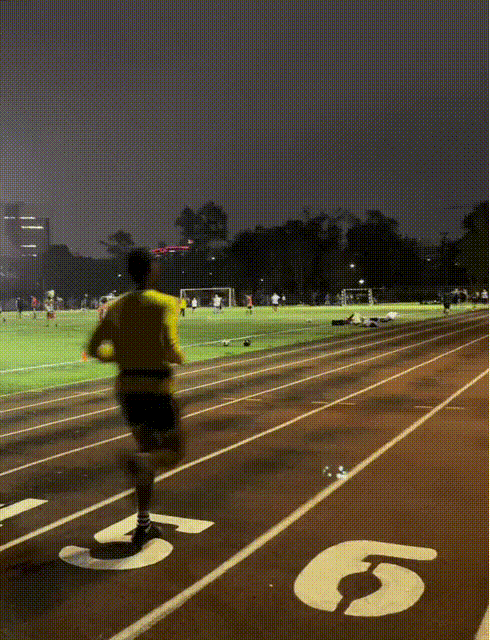

In [ ]:
cleaned['bins'] = np.where((cleaned['age'] < 25), '17-25',
                            (np.where((cleaned['age'] > 25) & (cleaned['age'] < 35), '26-34',
                            (np.where((cleaned['age'] > 34) & (cleaned['age'] < 44), '35-43',
                            (np.where((cleaned['age'] > 43) & (cleaned['age'] < 53), '44-52', 
                            (np.where((cleaned['age'] > 52) & (cleaned['age'] < 62), '53-61', 
                            (np.where((cleaned['age'] > 61) & (cleaned['age'] < 71), '62-70','71-90' )))))))))))

# DISCARDED CODE